# The Art of Analyzing Big Data- The Data Scientist's Toolbox

Test A 2022

## Imports

In [ ]:
!python -m spacy download en_core_web_lg
!pip install turicreate
!pip install plotly-express

In [ ]:
!pip install wget
!pip install pycountry
!pip install pyyaml==5.4.1
!pip install  imageai
!pip install gensim
!pip install pyLDAvis

In [ ]:
!pip install geopy
!pip install Nominatim
!pip install geopandas

In [ ]:
# snscrape
!pip3 install snscrape

In [ ]:
!pip install gnews
!git clone https://github.com/ranahaani/GNews.git

In [ ]:
from GNews.gnews import GNews
from matplotlib.pyplot import figure
from dateutil import parser

In [ ]:
import snscrape.modules.twitter as sntwitter
import itertools

In [ ]:
import os
import wget
from time import sleep
import re
from datetime import datetime, timedelta

import json
import requests
import csv
import pandas as pd
import numpy as np

import turicreate as tc
import turicreate.aggregate as agg

from IPython.display import Image
from IPython.core.display import HTML
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
from spacy import displacy
import pycountry
import plotly.express as px
import plotly.graph_objects as go
from sklearn.decomposition import PCA

from wordcloud import WordCloud, STOPWORDS
import spacy
from collections import Counter
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

nlp = spacy.load('en_core_web_lg')
nltk.download('stopwords')
nltk.download('punkt')

sns.set()
%matplotlib inline

In [ ]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import pyLDAvis
import pyLDAvis.gensim_models

In [ ]:
import networkx as nx

In [ ]:
from tqdm.notebook import  tqdm

## Question 1

On the 24th of June this year the Supreme Court decides to overturn Roe v. Wade's ruling, this has led to demonstrations across the US.
I chose **Colorado** state to analyze the sequence of events following the verdict.

### Part 1 - Sequence analysis of events

#### Google Search Trend

It is interesting to see the amount of publications that followed the verdict. That's why I used the Google API to see how many new searches every day were following the verdict.

In [ ]:
# google
GOOGLE_API_KEY = ''
GOOGLE_URL = 'https://www.googleapis.com/customsearch/v1'

country = 'Colorado'

In [ ]:
dates = [datetime(2022, 6, 17) + timedelta(days=i) for i in range(20)]
date2nbresults = {date: 0 for date in dates}

dates_formatted = [datetime.strftime(date, '%Y-%m-%d') for date in dates]

for date_f, next_date_f, date in zip(dates_formatted[:-1], dates_formatted[1:], dates[:-1]):
  res = requests.get(GOOGLE_URL, params={'key': GOOGLE_API_KEY, 'q':f'roe v wade {country} after:{date_f} before:{next_date_f}', 'cx':'e61c8b606ae201c14'})
  parsed = json.loads(res.content)
  nb_results = int(parsed['searchInformation']['totalResults'])
  date2nbresults[date] = nb_results

In [ ]:
df_trend =  pd.DataFrame(date2nbresults.items(), columns=['Date', 'DateValue'])
df_trend

,Date,DateValue
0,2022-06-17,4430
1,2022-06-18,3510
2,2022-06-19,3710
3,2022-06-20,5970
4,2022-06-21,6900
5,2022-06-22,8780
6,2022-06-23,11900
7,2022-06-24,19100
8,2022-06-25,20700
9,2022-06-26,126000


In [ ]:
px.line(df_trend, x = df_trend.Date, y = df_trend.DateValue, title='Number of new google search results of "Roe v Wade Colorado"', )

I took the dates between 17th of June and 5th of July (a few days before the decision and a few days after the decision).
As we can see there was a big jump of new google search results around the day of the decision.

#### Google Search Headlines Word Cloud

I have collected the latest google search results headlines. With Word Cloud, I expect to see meaningful words related to the decision.

In [ ]:
def collect_google_search_words(number_of_queries=10):
  words_acc = []
  for i in range(number_of_queries):
    res = requests.get(GOOGLE_URL, params={'key': GOOGLE_API_KEY, 'q':f'roe v wade {country}', 'cx':'e61c8b606ae201c14', 'start':i*10})
    parsed = json.loads(res.content)
    items = parsed['items']
    titles = [item['pagemap']['metatags'][0]['og:title'] for item in items if 'og:title' in list(item['pagemap']['metatags'][0].keys())]
    words = list(itertools.chain.from_iterable([title.split() for title in titles]))
    words_acc.append(words)
  words = list(itertools.chain.from_iterable(words_acc))
  return words

words = collect_google_search_words()

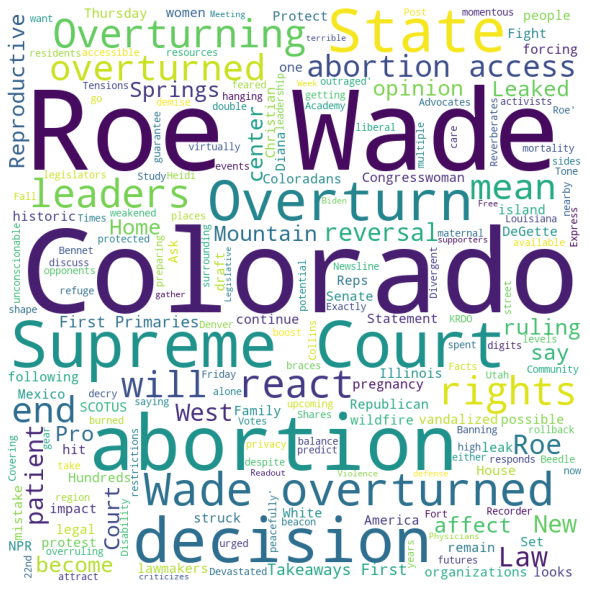

In [ ]:
google_words = ''
google_words += " ".join(words) + " "
stopwords = set(STOPWORDS)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(google_words)

# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

#### News Articles Analysis

From every city in the state of Colorado I collect articles related to protests. I then show the amount of articles for each city in Colorado on a heat map.

In [ ]:
# Get number of articles in each city in Colorado
colorado_cities = ["Akron Colorado", "Alamosa Colorado", "Allenspark Colorado", "Antonito Colorado", "Arboles Colorado", "Arriba Colorado", "Arvada Colorado", "Aspen Colorado", "Ault Colorado", "Aurora Colorado", "Avon Colorado", "Avondale Colorado", "Basalt Colorado", "Battlement Mesa Colorado", "Bayfield Colorado", "Bennett Colorado", "Berthoud Colorado", "Bethune Colorado", "Blanca Colorado", "Boone Colorado", "Boulder Colorado", "Breckenridge Colorado", "Brighton Colorado", "Broomfield Colorado", "Brush Colorado", "Buena Vista Colorado", "Burlington Colorado", "Byers Colorado", "Calhan Colorado", "Canon City Colorado", "Carbondale Colorado", "Castle Rock Colorado", "Cedaredge Colorado", "Center Colorado", "Central City Colorado", "Cheraw Colorado", "Cheyenne Wells Colorado", "Clifton Colorado", "Coal Creek Colorado", "Collbran Colorado", "Colorado City Colorado", "Colorado Springs Colorado", "Commerce City Colorado", "Cortez Colorado", "Craig Colorado", "Crawford Colorado", "Creede Colorado", "Crested Butte Colorado", "Cripple Creek Colorado", "Dacono Colorado", "De Beque Colorado", "Deer Trail Colorado", "Del Norte Colorado", "Delta Colorado", "Denver Colorado", "Dillon Colorado", "Dinosaur Colorado", "Dolores Colorado", "Dove Creek Colorado", "Durango Colorado", "Eads Colorado", "Eagle Colorado", "Eaton Colorado", "Eckley Colorado", "Edwards Colorado", "Eldorado Springs Colorado", "Elizabeth Colorado", "Empire Colorado", "Englewood Colorado", "Erie Colorado", "Estes Park Colorado", "Evans Colorado", "Evergreen Colorado", "Fairplay Colorado", "Firestone Colorado", "Flagler Colorado", "Fleming Colorado", "Florence Colorado", "Fort Collins Colorado", "Fort Garland Colorado", "Fort Lupton Colorado", "Fort Morgan Colorado", "Fountain Colorado", "Fowler Colorado", "Fraser Colorado", "Frederick Colorado", "Frisco Colorado", "Fruita Colorado", "Genoa Colorado", "Georgetown Colorado", "Gilcrest Colorado", "Glenwood Springs Colorado", "Golden Colorado", "Granada Colorado", "Granby Colorado", "Grand Junction Colorado", "Grand Lake Colorado", "Greeley Colorado", "Green Mountain Falls Colorado", "Gunnison Colorado", "Gypsum Colorado", "Haxtun Colorado", "Hayden Colorado", "Hillrose Colorado", "Holly Colorado", "Holyoke Colorado", "Hot Sulphur Springs Colorado", "Hotchkiss Colorado", "Hudson Colorado", "Hugo Colorado", "Idaho Springs Colorado", "Ignacio Colorado", "Iliff Colorado", "Indian Hills Colorado", "Jamestown Colorado", "Johnstown Colorado", "Julesburg Colorado", "Keenesburg Colorado", "Kersey Colorado", "Kiowa Colorado", "Kit Carson Colorado", "Kittredge Colorado", "Kremmling Colorado", "La Jara Colorado", "La Junta Colorado", "La Salle Colorado", "La Veta Colorado", "Lafayette Colorado", "Lake City Colorado", "Lamar Colorado", "Laporte Colorado", "Larkspur Colorado", "Las Animas Colorado", "Leadville Colorado", "Limon Colorado", "Littleton Colorado", "Log Lane Village Colorado", "Longmont Colorado", "Louisville Colorado", "Louviers Colorado", "Loveland Colorado", "Lyons Colorado", "Manassa Colorado", "Mancos Colorado", "Manitou Springs Colorado", "Manzanola Colorado", "Mead Colorado", "Meeker Colorado", "Merino Colorado", "Milliken Colorado", "Minturn Colorado", "Monte Vista Colorado", "Monument Colorado", "Morrison Colorado", "Naturita Colorado", "Nederland Colorado", "New Castle Colorado", "Niwot Colorado", "Norwood Colorado", "Nucla Colorado", "Nunn Colorado", "Oak Creek Colorado", "Olathe Colorado", "Olney Springs Colorado", "Ordway Colorado", "Otis Colorado", "Ouray Colorado", "Ovid Colorado", "Pagosa Springs Colorado", "Palisade Colorado", "Palmer Lake Colorado", "Paonia Colorado", "Parachute Colorado", "Parker Colorado", "Peetz Colorado", "Penrose Colorado", "Pierce Colorado", "Platteville Colorado", "Poncha Springs Colorado", "Pueblo Colorado", "Rangely Colorado", "Red Cliff Colorado", "Red Feather Lakes Colorado", "Rico Colorado", "Ridgway Colorado", "Rifle Colorado", "Rockvale Colorado", "Rocky Ford Colorado", "Romeo Colorado", "Rye Colorado", "Saguache Colorado", "Salida Colorado", "San Luis Colorado", "Sanford Colorado", "Sedalia Colorado", "Severance Colorado", "Silt Colorado", "Silver Plume Colorado", "Silverthorne Colorado", "Silverton Colorado", "Simla Colorado", "Snowmass Village Colorado", "South Fork Colorado", "Springfield Colorado", "Steamboat Springs Colorado", "Sterling Colorado", "Strasburg Colorado", "Stratton Colorado", "Sugar City Colorado", "Swink Colorado", "Telluride Colorado", "Thornton Colorado", "Timnath Colorado", "Towaoc Colorado", "Trinidad Colorado", "Vail Colorado", "Victor Colorado", "Walden Colorado", "Walsenburg Colorado", "Walsh Colorado", "Wellington Colorado", "Westcliffe Colorado", "Westminster Colorado", "Wheat Ridge Colorado", "Wiggins Colorado", "Wiley Colorado", "Windsor Colorado", "Winter Park Colorado", "Woodland Park Colorado", "Wray Colorado", "Yampa Colorado", "Yuma Colorado"]
citiy2nbresults = {}

for city in tqdm(colorado_cities):
    google_news = GNews()
    news = google_news.get_news(f'{city} protest')
    nb_results = len(news)
    citiy2nbresults[city] = int(nb_results)


citiy2nbresults = {k: v for k, v in sorted(citiy2nbresults.items(), key=lambda item: item[1], reverse=True)}
citiy2nbresults_df = pd.DataFrame({'city': citiy2nbresults.keys(), 'num_articles': citiy2nbresults.values()})
citiy2nbresults_df

100%|██████████| 232/232 [02:37<00:00,  1.47it/s]


,city,num_articles
0,Aurora Colorado,100
1,Boulder Colorado,100
2,Canon City Colorado,100
3,Center Colorado,100
4,Colorado City Colorado,100
...,...,...
227,Naturita Colorado,0
228,Nucla Colorado,0
229,Ordway Colorado,0
230,Peetz Colorado,0


In [ ]:
# Get Latitude and Longtitude of each city in Colorado
from geopy.geocoders import Nominatim

citiy2coordinates = {}

geolocator = Nominatim(user_agent="GetLoc")
for city in tqdm(colorado_cities):
  location = geolocator.geocode(city)
  citiy2coordinates[city] =  (location.latitude, location.longitude)
citiy2coordinates_df = pd.DataFrame({'city': citiy2coordinates.keys(), 'Lat': [t[0] for t in citiy2coordinates.values()], 'Long': [t[1] for t in citiy2coordinates.values()]})
citiy2coordinates_df

100%|██████████| 232/232 [01:56<00:00,  2.00it/s]


,city,Lat,Long
0,Akron Colorado,40.160537,-103.214384
1,Alamosa Colorado,37.578100,-105.789045
2,Allenspark Colorado,40.195362,-105.481836
3,Antonito Colorado,37.074476,-106.008635
4,Arboles Colorado,37.023280,-107.423492
...,...,...,...
227,Winter Park Colorado,39.882398,-105.780608
228,Woodland Park Colorado,38.993802,-105.057045
229,Wray Colorado,40.075882,-102.223253
230,Yampa Colorado,40.152484,-106.908658


In [ ]:
# Merge the two
city_df = citiy2nbresults_df.merge(citiy2coordinates_df, on='city')
city_df

,city,num_articles,Lat,Long
0,Aurora Colorado,100,39.740511,-104.830995
1,Boulder Colorado,100,40.014986,-105.270545
2,Canon City Colorado,100,38.442364,-105.222494
3,Center Colorado,100,37.749980,-106.112421
4,Colorado City Colorado,100,37.941645,-104.851673
...,...,...,...,...
227,Naturita Colorado,0,38.219091,-108.572693
228,Nucla Colorado,0,38.269435,-108.547869
229,Ordway Colorado,0,38.218061,-103.756061
230,Peetz Colorado,0,40.960783,-103.113635


In [ ]:
# Draw a heat map
import folium
from folium import plugins
base_map = folium.Map(location = [39.113, -105.358], zoom_start = 7)

city_df['weight'] = city_df['num_articles'] / city_df['num_articles'].max()
map_values = city_df[['Lat','Long','weight']]
data = map_values.values.tolist()
hm = plugins.HeatMap(data)
base_map.add_child(hm)

Here I want to check out the articles that related to donations in the days surrounding the decision. I am interested to see if, after the decision, more articles related to donations for abortion and women are published in Colorado state.

In [ ]:
end = parser.parse("2022-07-08")
start = end - timedelta(days=25)

delta = (end-start).days

date_list = [start + timedelta(days=x) for x in range(0, delta+1)]
date_tuple_list = list(((date.year, date.month, date.day) for date in date_list))

In [ ]:
datetimes = [datetime(*date) for date in date_tuple_list]
date2nbarticles = {date: 0 for date in date_tuple_list}

In [ ]:
article_list = []
for date_t, next2_date_t, date_datetime in tqdm(zip(date_tuple_list[:-2], date_tuple_list[2:], datetimes[:-2])):
  google_news = GNews(start_date=date_t, end_date=next2_date_t)
  colorado_news = google_news.get_news('Donation Colorado')
  for a in colorado_news:
    article_list.append([datetime(*date_t), a['title'], a['description']])

0it [00:00, ?it/s]

In [ ]:
# Creating a dataframe from the articles list above
article_df = pd.DataFrame(article_list, columns=['Datetime', 'Title', 'Description'])
article_df

,Datetime,Title,Description
0,2022-06-13,Colorado blood shortage: Here's where you can ...,Colorado blood shortage: Here's where you can ...
1,2022-06-13,Palmer Lake Pub owners surprised with $5K dona...,Palmer Lake Pub owners surprised with $5K dona...
2,2022-06-13,"Local organizations see fewer food donations, ...","Local organizations see fewer food donations, ..."
3,2022-06-13,"Avalanche surprise father, son with Stanley Cu...","Avalanche surprise father, son with Stanley Cu..."
4,2022-06-13,This is the group running ads boosting Republi...,This is the group running ads boosting Republi...
...,...,...,...
1874,2022-07-06,Breaking Down One-Star Yelp Reviews for Local ...,Breaking Down One-Star Yelp Reviews for Local ...
1875,2022-07-06,"Allen BELL Obituary (1976 - 2022) - Vandalia, ...","Allen BELL Obituary (1976 - 2022) - Vandalia, ..."
1876,2022-07-06,College football realignment: How an 18-team B...,College football realignment: How an 18-team B...
1877,2022-07-06,Melody Zumwalt Obituary (1957 - 2022) - Portag...,Melody Zumwalt Obituary (1957 - 2022) - Portag...


In [ ]:
def get_entites_from_text(text):
    entities_dict= {}
    #using spaCy to get entities
    doc = nlp(text)
    for entity in doc.ents:
        label = entity.label_
        if  label not in entities_dict:
            entities_dict[label] = set()
        entities_dict[label].add(entity.text)

    return entities_dict

article_df['Entities'] = article_df['Description'].apply(lambda x: get_entites_from_text(x))
article_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Datetime,Title,Description,Entities,ORG,Num
0,2022-06-13,Colorado blood shortage: Here's where you can ...,Colorado blood shortage: Here's where you can ...,"{'GPE': {'Colorado'}, 'CARDINAL': {'9News.com'...",{KUSA},1
1,2022-06-13,Palmer Lake Pub owners surprised with $5K dona...,Palmer Lake Pub owners surprised with $5K dona...,"{'ORG': {'Colorado Springs Gazette', 'Palmer L...","{Colorado Springs Gazette, Palmer Lake Pub}",2
2,2022-06-13,"Local organizations see fewer food donations, ...","Local organizations see fewer food donations, ...","{'ORG': {'KOAA News'}, 'CARDINAL': {'5'}}",{KOAA News},1
3,2022-06-13,"Avalanche surprise father, son with Stanley Cu...","Avalanche surprise father, son with Stanley Cu...","{'ORG': {'Avalanche', 'Denver 7 Colorado News'}}","{Avalanche, Denver 7 Colorado News}",2
6,2022-06-13,"Egg donors can receive up to $8,000 per donati...","Egg donors can receive up to $8,000 per donati...","{'MONEY': {'up to $8,000'}, 'ORG': {'Shady Gro...",{Shady Grove Fertility},1
...,...,...,...,...,...,...
1873,2022-07-06,13 pediatric kidney patients hope to become th...,13 pediatric kidney patients hope to become th...,"{'CARDINAL': {'2023', '13'}, 'ORG': {'KULR-TV'...","{KULR-TV, American Kidney Fund}",2
1874,2022-07-06,Breaking Down One-Star Yelp Reviews for Local ...,Breaking Down One-Star Yelp Reviews for Local ...,{'ORG': {'Westword'}},{Westword},1
1875,2022-07-06,"Allen BELL Obituary (1976 - 2022) - Vandalia, ...","Allen BELL Obituary (1976 - 2022) - Vandalia, ...","{'PERSON': {'Allen BELL Obituary'}, 'DATE': {'...","{Legacy.com, OH - Dayton Daily News}",2
1877,2022-07-06,Melody Zumwalt Obituary (1957 - 2022) - Portag...,Melody Zumwalt Obituary (1957 - 2022) - Portag...,"{'PERSON': {'Melody Zumwalt Obituary'}, 'DATE'...",{Legacy.com},1


In [ ]:
# I extract the organization mentioned in each article to see which organizations are mentioned
def get_org(ent):
  if 'ORG' in ent.keys():

    return list(ent['ORG'])[0]
  else:
    return None

article_df['ORG'] = article_df['Entities'].apply(lambda x: get_org(x))
article_df = article_df.dropna()
article_df['Num'] = article_df['ORG'].apply(lambda x: len(x))
article_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Datetime,Title,Description,Entities,ORG,Num
0,2022-06-13,Colorado blood shortage: Here's where you can ...,Colorado blood shortage: Here's where you can ...,"{'GPE': {'Colorado'}, 'CARDINAL': {'9News.com'...",KUSA,4
1,2022-06-13,Palmer Lake Pub owners surprised with $5K dona...,Palmer Lake Pub owners surprised with $5K dona...,"{'ORG': {'Colorado Springs Gazette', 'Palmer L...",Colorado Springs Gazette,24
2,2022-06-13,"Local organizations see fewer food donations, ...","Local organizations see fewer food donations, ...","{'ORG': {'KOAA News'}, 'CARDINAL': {'5'}}",KOAA News,9
3,2022-06-13,"Avalanche surprise father, son with Stanley Cu...","Avalanche surprise father, son with Stanley Cu...","{'ORG': {'Avalanche', 'Denver 7 Colorado News'}}",Avalanche,9
6,2022-06-13,"Egg donors can receive up to $8,000 per donati...","Egg donors can receive up to $8,000 per donati...","{'MONEY': {'up to $8,000'}, 'ORG': {'Shady Gro...",Shady Grove Fertility,21
...,...,...,...,...,...,...
1873,2022-07-06,13 pediatric kidney patients hope to become th...,13 pediatric kidney patients hope to become th...,"{'CARDINAL': {'2023', '13'}, 'ORG': {'KULR-TV'...",KULR-TV,7
1874,2022-07-06,Breaking Down One-Star Yelp Reviews for Local ...,Breaking Down One-Star Yelp Reviews for Local ...,{'ORG': {'Westword'}},Westword,8
1875,2022-07-06,"Allen BELL Obituary (1976 - 2022) - Vandalia, ...","Allen BELL Obituary (1976 - 2022) - Vandalia, ...","{'PERSON': {'Allen BELL Obituary'}, 'DATE': {'...",Legacy.com,10
1877,2022-07-06,Melody Zumwalt Obituary (1957 - 2022) - Portag...,Melody Zumwalt Obituary (1957 - 2022) - Portag...,"{'PERSON': {'Melody Zumwalt Obituary'}, 'DATE'...",Legacy.com,10


In [ ]:
px.bar(article_df, x="Datetime", y="Num",color = 'ORG',title="ORG mentioned in articles that related to donation in Colorado")

#### Wikipedia

Analayze the wikipedia page of "Abortion in Colorado".

In [ ]:
!pip install wikipedia

In [ ]:
import wikipedia
w = wikipedia.page("Abortion in Colorado")

In [ ]:
doc = nlp(w.summary)
displacy.render(doc, style='ent', jupyter=True)

In [ ]:
doc = nlp(w.content)
displacy.render(doc, style='ent', jupyter=True)

### Part 2 - Collecting tweets

#### Collecting and tagging tweets

1.   Collect all tweets posted in the state of Colorado related to the verdict using relevant terms.
2.   Tagging tweets to one of the political opinions using relevant terms related to each opinion.

In [ ]:
state = "Colorado"

In [ ]:
# Terms related to the verdict
searchTerms = [
"Roe V Wade",
"Ginsburg",
"SCOTUSBlog",
"SCOTUS",
"Supreme Court",
"Supreme Court of the United States",
"Pelosi",
"Clinton",
"Bernie",
"Biden",
"Sanders",
"Republicans",
"Democrats",
"Liberals",
"Conservatives",
"ProLife",
'ProChice',
'Abortion',
'BanOfourBodies'
]

In [ ]:
# Collects tweets that contain terms related to the verdict
tweets_list = []
for term in searchTerms:
  for i,tweet in enumerate(sntwitter.TwitterSearchScraper(f'{term} since:2022-06-17 until:2022-07-05 near:{state} lang:en').get_items()):
    tweets_list.append([tweet.date, tweet.id, tweet.content, tweet.username])

In [ ]:
# Creating a dataframe from the tweets list above
tweets_df = pd.DataFrame(tweets_list, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

In [ ]:
sorted_tweets = tweets_df.sort_values(by='Datetime').reset_index(drop=True)
sorted_tweets

,Datetime,Tweet Id,Text,Username
0,2022-06-30 03:11:29+00:00,1542345046913064960,"@RpsAgainstTrump Meanwhile, the American peopl...",Utmb_Colorado
1,2022-06-30 03:17:25+00:00,1542346539456073728,@fitswimmer09 @Uileag @fake_biden They won’t r...,capthegoat
2,2022-06-30 03:18:28+00:00,1542346806905806850,"I hope you are listening, @harrisonjaime @Spea...",LKDeal
3,2022-06-30 03:19:47+00:00,1542347138700496897,"@Trey_Explainer @RafaelmenaI Is that ""rigging,...",MattWriter
4,2022-06-30 03:26:16+00:00,1542348768158240768,@MaryPrenosil1 @The_Catty_Cat @DisabledDoctor ...,Imafrayedknot1
...,...,...,...,...
2501,2022-07-04 23:49:24+00:00,1544106133434077185,"Little-known fact: I own a youth-sized Don ""Ma...",ZachThaxton
2502,2022-07-04 23:52:18+00:00,1544106861871316992,@zukosmama I went through the Senate and the S...,axia_laChapelle
2503,2022-07-04 23:52:38+00:00,1544106944994021376,@BernieSanders This is a public health emergen...,barbwriting
2504,2022-07-04 23:55:22+00:00,1544107634596380672,"Just like in our neighboring country, Canada. ...",Ziggyfan_1


In [ ]:
# politically-self-identifying users terms
democrat = ['ginsburg', 'rbg', 'pro-choice', 'prochoice', 'liberal', 'democrat', 'biden supporter', 'dem',
            'progressive', 'republicans are killing democracy', '#LGQBTQ', 'anti-maga', 'cult',
            'against the gop', 'pronouns', 'blacklivesmatter', 'blm']

republican = ['pro-life', 'prolife', 'ourbodiesourchice', 'banoffourbodies', 'abortionrights' 'republican', 'conservative', 'christian', 'catholic', 'trump', 'god',
              'my country', 'presbyterian', 'patriot', 'white', 'straight', 'president trump',
              '#alllivesmatter']

In [ ]:
# Tag tweets using terms related to each political opinion (Democrats / Republicans)
def identify_tweet(tweet):
  tweet_words = tweet.split()
  for word in tweet_words:
    if word.startswith('#') or word.startswith('@'):
      word = word[1:]
    if word.lower() in democrat:
      return 'pro-choice'
    elif word.lower() in republican:
      return 'pro-life'
    else:
      return 'unknown'

In [ ]:
# identify users opinion (democrat/republican)
sorted_tweets['Label'] = sorted_tweets['Text'].apply(lambda t: identify_tweet(t))
sorted_tweets

,Datetime,Tweet Id,Text,Username,Label
0,2022-06-30 03:11:29+00:00,1542345046913064960,"@RpsAgainstTrump Meanwhile, the American peopl...",Utmb_Colorado,unknown
1,2022-06-30 03:17:25+00:00,1542346539456073728,@fitswimmer09 @Uileag @fake_biden They won’t r...,capthegoat,unknown
2,2022-06-30 03:18:28+00:00,1542346806905806850,"I hope you are listening, @harrisonjaime @Spea...",LKDeal,unknown
3,2022-06-30 03:19:47+00:00,1542347138700496897,"@Trey_Explainer @RafaelmenaI Is that ""rigging,...",MattWriter,unknown
4,2022-06-30 03:26:16+00:00,1542348768158240768,@MaryPrenosil1 @The_Catty_Cat @DisabledDoctor ...,Imafrayedknot1,unknown
...,...,...,...,...,...
2501,2022-07-04 23:49:24+00:00,1544106133434077185,"Little-known fact: I own a youth-sized Don ""Ma...",ZachThaxton,unknown
2502,2022-07-04 23:52:18+00:00,1544106861871316992,@zukosmama I went through the Senate and the S...,axia_laChapelle,unknown
2503,2022-07-04 23:52:38+00:00,1544106944994021376,@BernieSanders This is a public health emergen...,barbwriting,unknown
2504,2022-07-04 23:55:22+00:00,1544107634596380672,"Just like in our neighboring country, Canada. ...",Ziggyfan_1,unknown


In [ ]:
sorted_tweets['Label'].value_counts()

unknown       2493
pro-choice       9
pro-life         4
Name: Label, dtype: int64

#### Proptype - Labeled Tweets

I found a dataset of tweets about abortion and Roe v. Wade that manually labeled according to their abortion stance ("pro-choice", "pro-life", "neutral", "both"). This dataset labeled by Surge AI (https://www.surgehq.ai/blog/dataset-of-roe-v-wade-tweets-labeled-by-abortion-stance).

I will use this dataset for my prototype.

In [ ]:
df_rw = pd.read_csv('/content/[Surge AI] Dataset of Roe v. Wade Tweets, Labeled by Abortion Stance.csv')
df_rw

,worker_id,task_id,task_response_id,is_reviewed,review_score,tweet_id,text,username,bio,Categorize the tweet
0,Z6J69GNZYEXY,9d59aa1b-4a9b-4ec9-b67c-54398e67f4e1,010d75e3-5db5-43ca-b43f-afcecd7d3232,True,50.0,1540797015130619904,"roe v wade criminalizes afabs, felons cant vot...",notjaspr,̨𖥔་ ˖ 💎,Pro-choice
1,4TG67HVWJNDP,909fc038-d4fd-45f0-b849-d975760f163d,02dcb39a-c525-418a-9198-5c08d354935a,False,NaN,1540795861126352898,It getting pregnant endangers your life......\...,AChristhope,Humankind is neither humane nor kind. Creator ...,Pro-life
2,2AZWNZRTVACE,0dcd0bda-127d-4b57-a479-08efc85fb902,031abcc4-deb2-42b2-8b36-979f77d006c6,False,NaN,1540784525864669186,@bluekat323 @leighmatsell @caambers @Robthefro...,LegalLatino2022,Left January 2021. Starting anew. Love all ani...,Pro-life
3,6CNHTCG6W6XM,8617b170-4d3a-4789-b020-c51c0ce1e7c9,035e1a0b-fec5-4c88-81a4-6a79ba4c1d2f,False,NaN,1540795218097688576,@JoeBiden Dont you have the power to make an e...,Sploiv,i dont fuckin know anymore,Pro-choice
4,7R2NKCJQNXPP,851318f8-7671-4f45-9a98-58ebe7013de1,037c1004-9dd9-4bce-a792-adffb278be86,False,NaN,1540795712610258944,https://t.co/2vL1gxc3P3,AuntyLush,Judge jury and old joyce ~~ She/her,Pro-choice
...,...,...,...,...,...,...,...,...,...,...
1020,WZZMK43NG9CA,7cdee008-b1e6-4ab2-8a1a-4da51f03fe7c,fef1228a-f46c-4b28-b93c-4d5bc992203f,False,NaN,1540795787084529667,Alito was on the appellate court that upheld a...,Man_In_Gray,NaN,Pro-choice
1021,GM7WMPEN2H9W,4f09396c-e1d2-41d3-9789-aad4482f9654,ff31b8af-d863-43ab-a781-0ee151981515,False,NaN,1540784745927376897,63 percent of the American population supports...,owensj4319,Retired publicist. Twitter is 1of my favorite ...,Pro-choice
1022,T3RMAEPRMD6J,9363e559-9bab-4b9c-954f-4dc2babecd86,ffb6103e-9ac2-4772-a0ed-30d55b1df836,False,NaN,1540795956421021696,Reproductive Rights are womens rights! Stop ta...,ranki2002,Policy enthusiast. Environmentalist. Feminist.,Pro-choice
1023,7R2NKCJQNXPP,57f411dc-68dc-4515-b49b-407b7d2cbf77,ffc6abf4-cf43-441f-823d-4e628ff830ff,False,NaN,1540795262490247168,this WOMAN voted for trump TWICE and is compla...,paulafledd,NaN,Pro-choice


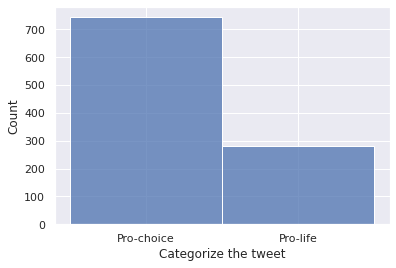

In [ ]:
sns.histplot(data=df_rw, x='Categorize the tweet')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



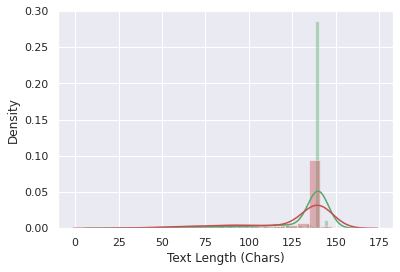

In [ ]:
df_rw['length'] = df_rw['text'].apply(lambda t: len(t))
sns.distplot(df_rw[df_rw['Categorize the tweet'] == 'Pro-choice']['length'], axlabel="Text Length (Chars)", color='g')
sns.distplot(df_rw[df_rw['Categorize the tweet'] == 'Pro-life']['length'], axlabel="Text Length (Chars)", color='r')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



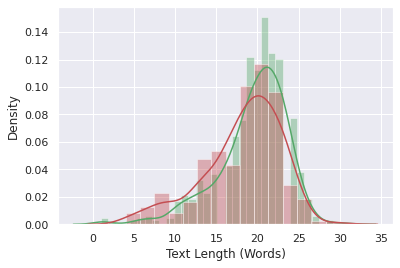

In [ ]:
df_rw['words_num'] = df_rw['text'].apply(lambda t: len(t.split()))
sns.distplot(df_rw[df_rw['Categorize the tweet'] == 'Pro-choice']['words_num'], axlabel="Text Length (Words)", color='g')
sns.distplot(df_rw[df_rw['Categorize the tweet'] == 'Pro-life']['words_num'], axlabel="Text Length (Words)", color='r')

In [ ]:
def skip_word(w):
  stopwords = set(STOPWORDS)
  stopwords_parts = {"'s", " ' s'", " `s", "'", "/" ,"."}
  if w.lower() in ['https', 'fwd', 'roe', 'wade', 'vs', 'amp']:
    return True
  if len(w) <2:
      return True
  if w.isdigit():
      return True
  if w in stopwords:
      return True
  for p in stopwords_parts:
    if p in w:
      return True
  return False

In [ ]:
df_rw['word_list'] = df_rw['text'].apply(lambda txt: [w for w in word_tokenize(txt) if not skip_word(w)])
df_rw

,worker_id,task_id,task_response_id,is_reviewed,review_score,tweet_id,text,username,bio,Categorize the tweet,word_list
0,Z6J69GNZYEXY,9d59aa1b-4a9b-4ec9-b67c-54398e67f4e1,010d75e3-5db5-43ca-b43f-afcecd7d3232,True,50.0,1540797015130619904,"roe v wade criminalizes afabs, felons cant vot...",notjaspr,̨𖥔་ ˖ 💎,Pro-choice,"[criminalizes, afabs, felons, cant, vote, almo..."
1,4TG67HVWJNDP,909fc038-d4fd-45f0-b849-d975760f163d,02dcb39a-c525-418a-9198-5c08d354935a,False,NaN,1540795861126352898,It getting pregnant endangers your life......\...,AChristhope,Humankind is neither humane nor kind. Creator ...,Pro-life,"[It, getting, pregnant, endangers, life, THEN,..."
2,2AZWNZRTVACE,0dcd0bda-127d-4b57-a479-08efc85fb902,031abcc4-deb2-42b2-8b36-979f77d006c6,False,NaN,1540784525864669186,@bluekat323 @leighmatsell @caambers @Robthefro...,LegalLatino2022,Left January 2021. Starting anew. Love all ani...,Pro-life,"[bluekat323, leighmatsell, caambers, Robthefro..."
3,6CNHTCG6W6XM,8617b170-4d3a-4789-b020-c51c0ce1e7c9,035e1a0b-fec5-4c88-81a4-6a79ba4c1d2f,False,NaN,1540795218097688576,@JoeBiden Dont you have the power to make an e...,Sploiv,i dont fuckin know anymore,Pro-choice,"[JoeBiden, Dont, power, make, executive, order..."
4,7R2NKCJQNXPP,851318f8-7671-4f45-9a98-58ebe7013de1,037c1004-9dd9-4bce-a792-adffb278be86,False,NaN,1540795712610258944,https://t.co/2vL1gxc3P3,AuntyLush,Judge jury and old joyce ~~ She/her,Pro-choice,[]
...,...,...,...,...,...,...,...,...,...,...,...
1020,WZZMK43NG9CA,7cdee008-b1e6-4ab2-8a1a-4da51f03fe7c,fef1228a-f46c-4b28-b93c-4d5bc992203f,False,NaN,1540795787084529667,Alito was on the appellate court that upheld a...,Man_In_Gray,NaN,Pro-choice,"[Alito, appellate, court, upheld, abortion, re..."
1021,GM7WMPEN2H9W,4f09396c-e1d2-41d3-9789-aad4482f9654,ff31b8af-d863-43ab-a781-0ee151981515,False,NaN,1540784745927376897,63 percent of the American population supports...,owensj4319,Retired publicist. Twitter is 1of my favorite ...,Pro-choice,"[percent, American, population, supports, majo..."
1022,T3RMAEPRMD6J,9363e559-9bab-4b9c-954f-4dc2babecd86,ffb6103e-9ac2-4772-a0ed-30d55b1df836,False,NaN,1540795956421021696,Reproductive Rights are womens rights! Stop ta...,ranki2002,Policy enthusiast. Environmentalist. Feminist.,Pro-choice,"[Reproductive, Rights, womens, rights, Stop, t..."
1023,7R2NKCJQNXPP,57f411dc-68dc-4515-b49b-407b7d2cbf77,ffc6abf4-cf43-441f-823d-4e628ff830ff,False,NaN,1540795262490247168,this WOMAN voted for trump TWICE and is compla...,paulafledd,NaN,Pro-choice,"[WOMAN, voted, trump, TWICE, complaining, over..."


#### Word Cloud

In [ ]:
def draw_words_cloud(word_list):
  wordcloud = WordCloud(width = 800, height = 800, background_color ='white', min_font_size = 10)
  c = Counter(word_list)
  d = {k:v for k,v in dict(c).items()}
  wordcloud.generate_from_frequencies(d)
  plt.figure(figsize = (20, 20), facecolor = None)
  plt.imshow(wordcloud)

##### Pro-choice

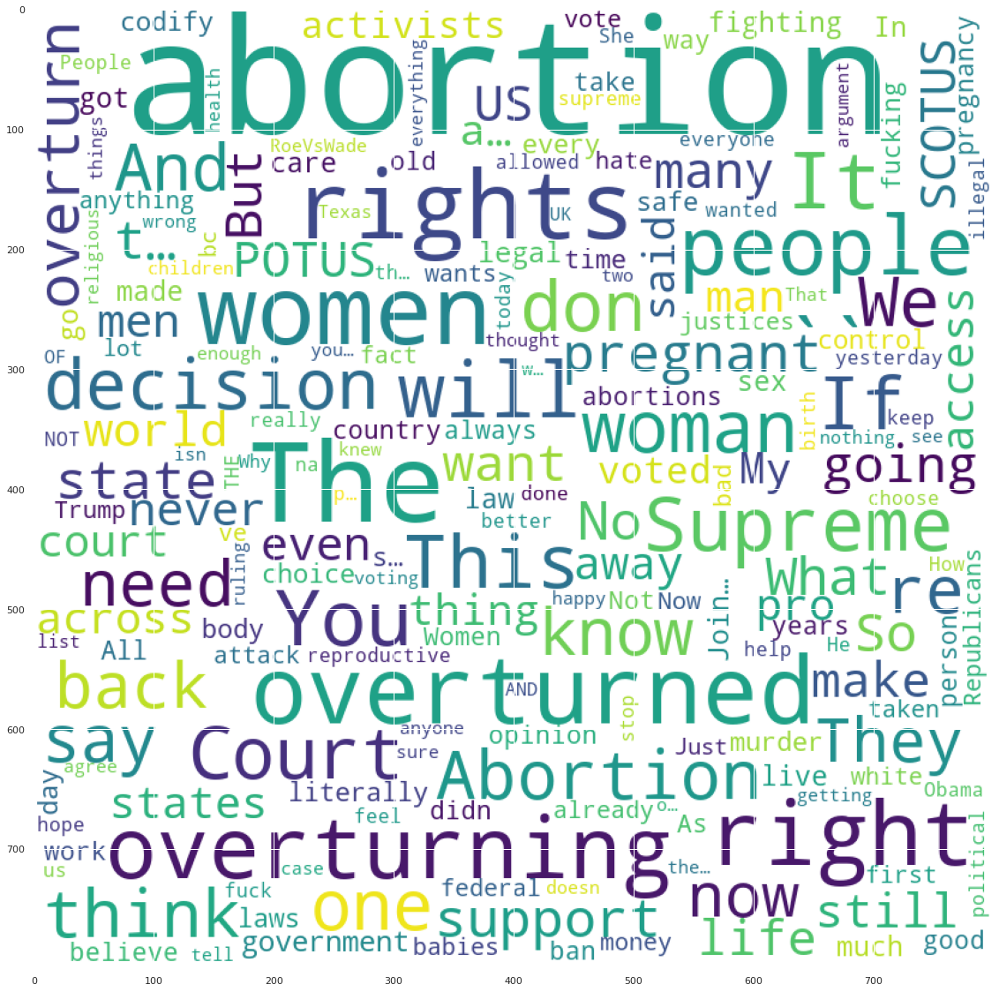

In [ ]:
import itertools
word_list_pc = list(itertools.chain.from_iterable(df_rw[df_rw['Categorize the tweet'] == 'Pro-choice']['word_list'].values))
draw_words_cloud(word_list_pc)

##### Pro-life

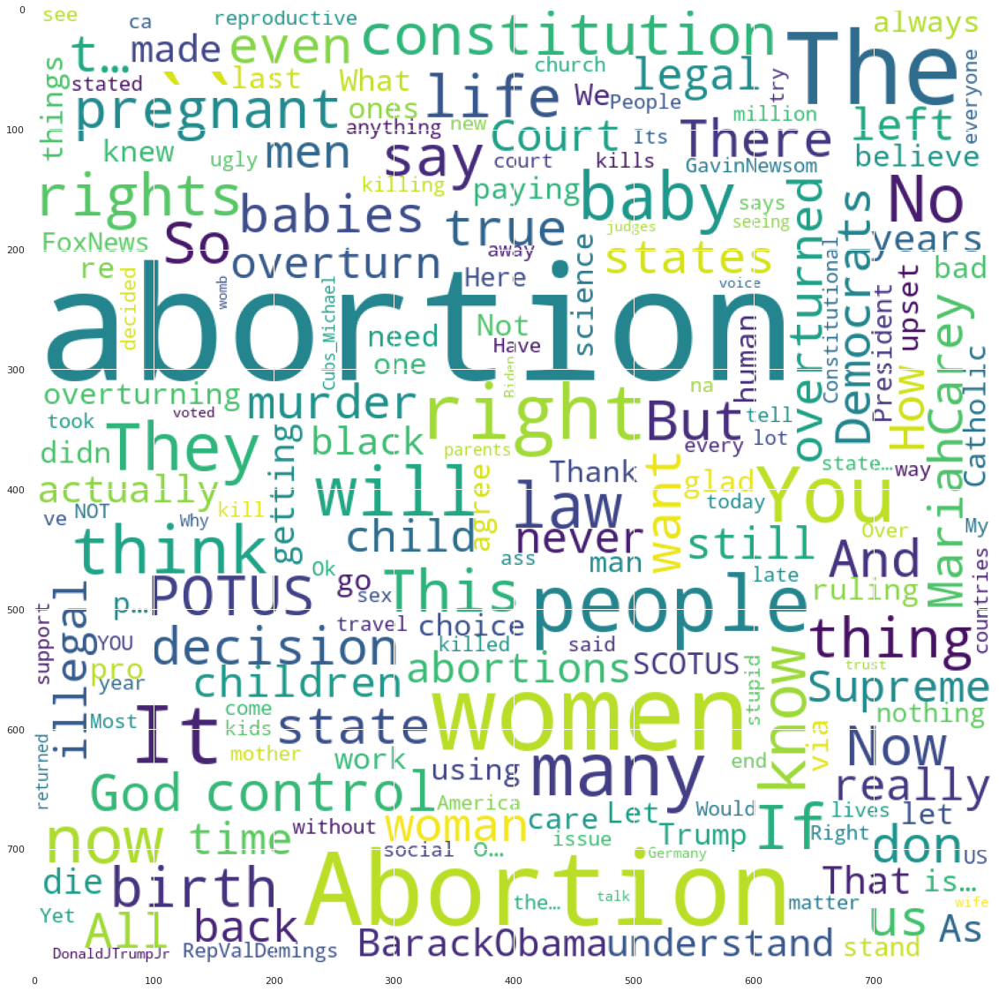

In [ ]:
word_list_pl = list(itertools.chain.from_iterable(df_rw[df_rw['Categorize the tweet'] == 'Pro-life']['word_list'].values))
draw_words_cloud(word_list_pl)

#### Map

In [ ]:
def get_entites_from_text(text):
    entities_dict= {}
    #using spaCy to get entities
    doc = nlp(text)
    for entity in doc.ents:
        label = entity.label_
        if  label not in entities_dict:
            entities_dict[label] = set()
        entities_dict[label].add(entity.text)

    return entities_dict

In [ ]:
df_rw['entities'] = df_rw['text'].apply(lambda x: get_entites_from_text(x))
df_rw

,worker_id,task_id,task_response_id,is_reviewed,review_score,tweet_id,text,username,bio,Categorize the tweet,word_list,entities
0,Z6J69GNZYEXY,9d59aa1b-4a9b-4ec9-b67c-54398e67f4e1,010d75e3-5db5-43ca-b43f-afcecd7d3232,True,50.0,1540797015130619904,"roe v wade criminalizes afabs, felons cant vot...",notjaspr,̨𖥔་ ˖ 💎,Pro-choice,"[criminalizes, afabs, felons, cant, vote, almo...",{'LAW': {'roe v wade'}}
1,4TG67HVWJNDP,909fc038-d4fd-45f0-b849-d975760f163d,02dcb39a-c525-418a-9198-5c08d354935a,False,NaN,1540795861126352898,It getting pregnant endangers your life......\...,AChristhope,Humankind is neither humane nor kind. Creator ...,Pro-life,"[It, getting, pregnant, endangers, life, THEN,...",{}
2,2AZWNZRTVACE,0dcd0bda-127d-4b57-a479-08efc85fb902,031abcc4-deb2-42b2-8b36-979f77d006c6,False,NaN,1540784525864669186,@bluekat323 @leighmatsell @caambers @Robthefro...,LegalLatino2022,Left January 2021. Starting anew. Love all ani...,Pro-life,"[bluekat323, leighmatsell, caambers, Robthefro...",{'PERSON': {'https://t.co/THft1peY8s'}}
3,6CNHTCG6W6XM,8617b170-4d3a-4789-b020-c51c0ce1e7c9,035e1a0b-fec5-4c88-81a4-6a79ba4c1d2f,False,NaN,1540795218097688576,@JoeBiden Dont you have the power to make an e...,Sploiv,i dont fuckin know anymore,Pro-choice,"[JoeBiden, Dont, power, make, executive, order...",{'LAW': {'Roe v Wade'}}
4,7R2NKCJQNXPP,851318f8-7671-4f45-9a98-58ebe7013de1,037c1004-9dd9-4bce-a792-adffb278be86,False,NaN,1540795712610258944,https://t.co/2vL1gxc3P3,AuntyLush,Judge jury and old joyce ~~ She/her,Pro-choice,[],{}
...,...,...,...,...,...,...,...,...,...,...,...,...
1020,WZZMK43NG9CA,7cdee008-b1e6-4ab2-8a1a-4da51f03fe7c,fef1228a-f46c-4b28-b93c-4d5bc992203f,False,NaN,1540795787084529667,Alito was on the appellate court that upheld a...,Man_In_Gray,NaN,Pro-choice,"[Alito, appellate, court, upheld, abortion, re...","{'PERSON': {'Alito', 'O'Connor', 'Casey'}}"
1021,GM7WMPEN2H9W,4f09396c-e1d2-41d3-9789-aad4482f9654,ff31b8af-d863-43ab-a781-0ee151981515,False,NaN,1540784745927376897,63 percent of the American population supports...,owensj4319,Retired publicist. Twitter is 1of my favorite ...,Pro-choice,"[percent, American, population, supports, majo...","{'PERCENT': {'63 percent'}, 'NORP': {'American..."
1022,T3RMAEPRMD6J,9363e559-9bab-4b9c-954f-4dc2babecd86,ffb6103e-9ac2-4772-a0ed-30d55b1df836,False,NaN,1540795956421021696,Reproductive Rights are womens rights! Stop ta...,ranki2002,Policy enthusiast. Environmentalist. Feminist.,Pro-choice,"[Reproductive, Rights, womens, rights, Stop, t...",{'ORG': {'WOMEN'}}
1023,7R2NKCJQNXPP,57f411dc-68dc-4515-b49b-407b7d2cbf77,ffc6abf4-cf43-441f-823d-4e628ff830ff,False,NaN,1540795262490247168,this WOMAN voted for trump TWICE and is compla...,paulafledd,NaN,Pro-choice,"[WOMAN, voted, trump, TWICE, complaining, over...",{'LAW': {'roe v wade'}}


In [ ]:
find_most_common_location = []
for d in df_rw['entities']:
    if 'GPE' in d:
      find_most_common_location +=  d['GPE']

locations = []
for c in find_most_common_location:
    if '@' in c or 'https' in c:
      continue
    else:
      locations.append(c)

locations_dict = dict(Counter(locations))
df_locations = pd.DataFrame.from_dict(data=[locations_dict]).T
df_locations.reset_index(inplace=True)
df_locations.columns = ['GPE', 'numTweets']

In [ ]:
def get_country_to_alpha2(country):
  if country.lower() in ['the united state', 'the united states', 'america', 'us states', 'states', 'us', 'u.s.', 'usa']:
    return 'US'
  elif country.lower() in ['uk', 'il', 'sc', 'wa', 'ky', 'ma']:
    return country
  elif country.lower() in ['the british isles']:
    return 'UK'
  elif country.lower() in ['the soviet union']:
    return 'US'
  elif country.lower() in ['b.c.']:
    return 'BC'
  else:
    try:
      return pycountry.countries.get(name=country).alpha_2
    except:
      return None
  return None

df_locations['alpha2'] = df_locations['GPE'].apply(lambda c: get_country_to_alpha2(c))
df_locations.dropna()
df_g = df_locations.groupby('alpha2').sum()
df_g = df_g.reset_index()
df_g

,alpha2,numTweets
0,BC,1
1,CA,4
2,CN,2
3,DE,2
4,GU,1
5,IL,1
6,KY,1
7,MA,1
8,MX,2
9,PL,1


In [ ]:
def alpha2_to_name(a):
  try:
    return pycountry.countries.get(alpha_2=a.lower()).name
  except:
    return None

def get_country_to_alpha3(country):
  try:
    return pycountry.countries.get(name=country).alpha_3
  except:
    return None


df_g['country_name'] = df_g['alpha2'].apply(lambda a: alpha2_to_name(a))
df_g = df_g.dropna()
df_g['alpha3'] = df_g['country_name'].apply(lambda country: get_country_to_alpha3(country))
df_g

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,alpha2,numTweets,country_name,alpha3
1,CA,4,Canada,CAN
2,CN,2,China,CHN
3,DE,2,Germany,DEU
4,GU,1,Guam,GUM
5,IL,1,Israel,ISR
6,KY,1,Cayman Islands,CYM
7,MA,1,Morocco,MAR
8,MX,2,Mexico,MEX
9,PL,1,Poland,POL
10,PR,1,Puerto Rico,PRI


In [ ]:
px.scatter_geo(df_g, locations="alpha3", hover_name="country_name", size="numTweets", projection="natural earth")

#### TSNE & PCA

In [ ]:
df_rw['vector'] = df_rw['text'].apply(lambda t: nlp(t).vector)
df_rw

,worker_id,task_id,task_response_id,is_reviewed,review_score,tweet_id,text,username,bio,Categorize the tweet,vector
0,Z6J69GNZYEXY,9d59aa1b-4a9b-4ec9-b67c-54398e67f4e1,010d75e3-5db5-43ca-b43f-afcecd7d3232,True,50.0,1540797015130619904,"roe v wade criminalizes afabs, felons cant vot...",notjaspr,̨𖥔་ ˖ 💎,Pro-choice,"[-0.034190044, 0.121848665, -0.10714578, -0.09..."
1,4TG67HVWJNDP,909fc038-d4fd-45f0-b849-d975760f163d,02dcb39a-c525-418a-9198-5c08d354935a,False,NaN,1540795861126352898,It getting pregnant endangers your life......\...,AChristhope,Humankind is neither humane nor kind. Creator ...,Pro-life,"[-0.123775326, 0.12817787, -0.24763903, -0.013..."
2,2AZWNZRTVACE,0dcd0bda-127d-4b57-a479-08efc85fb902,031abcc4-deb2-42b2-8b36-979f77d006c6,False,NaN,1540784525864669186,@bluekat323 @leighmatsell @caambers @Robthefro...,LegalLatino2022,Left January 2021. Starting anew. Love all ani...,Pro-life,"[-0.07685649, 0.13003431, -0.010977294, -0.013..."
3,6CNHTCG6W6XM,8617b170-4d3a-4789-b020-c51c0ce1e7c9,035e1a0b-fec5-4c88-81a4-6a79ba4c1d2f,False,NaN,1540795218097688576,@JoeBiden Dont you have the power to make an e...,Sploiv,i dont fuckin know anymore,Pro-choice,"[0.03158996, 0.04059303, -0.048587997, 0.07662..."
4,7R2NKCJQNXPP,851318f8-7671-4f45-9a98-58ebe7013de1,037c1004-9dd9-4bce-a792-adffb278be86,False,NaN,1540795712610258944,https://t.co/2vL1gxc3P3,AuntyLush,Judge jury and old joyce ~~ She/her,Pro-choice,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...,...,...,...,...,...
1020,WZZMK43NG9CA,7cdee008-b1e6-4ab2-8a1a-4da51f03fe7c,fef1228a-f46c-4b28-b93c-4d5bc992203f,False,NaN,1540795787084529667,Alito was on the appellate court that upheld a...,Man_In_Gray,NaN,Pro-choice,"[0.08635727, 0.15713534, 0.044896297, 0.064970..."
1021,GM7WMPEN2H9W,4f09396c-e1d2-41d3-9789-aad4482f9654,ff31b8af-d863-43ab-a781-0ee151981515,False,NaN,1540784745927376897,63 percent of the American population supports...,owensj4319,Retired publicist. Twitter is 1of my favorite ...,Pro-choice,"[-0.038434472, 0.029822562, 0.10242179, 0.0173..."
1022,T3RMAEPRMD6J,9363e559-9bab-4b9c-954f-4dc2babecd86,ffb6103e-9ac2-4772-a0ed-30d55b1df836,False,NaN,1540795956421021696,Reproductive Rights are womens rights! Stop ta...,ranki2002,Policy enthusiast. Environmentalist. Feminist.,Pro-choice,"[-0.031973876, 0.04464329, -0.123732716, 0.066..."
1023,7R2NKCJQNXPP,57f411dc-68dc-4515-b49b-407b7d2cbf77,ffc6abf4-cf43-441f-823d-4e628ff830ff,False,NaN,1540795262490247168,this WOMAN voted for trump TWICE and is compla...,paulafledd,NaN,Pro-choice,"[-0.032711167, 0.13089357, -0.07110361, 0.0167..."


In [ ]:
X = []
for v in df_rw['vector']:
    X.append(v)
X = np.array(X)
print("Computed X: ", X.shape)
X_embedded = TSNE(n_components=2,perplexity=20, n_iter=250, verbose=2).fit_transform(X)
print("Computed t-SNE", X_embedded.shape)

Computed X:  (1025, 300)
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1025 samples in 0.001s...
[t-SNE] Computed neighbors for 1025 samples in 0.073s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1025
[t-SNE] Computed conditional probabilities for sample 1025 / 1025
[t-SNE] Mean sigma: 0.324744
[t-SNE] Computed conditional probabilities in 0.054s


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Iteration 50: error = 85.1752396, gradient norm = 0.3202596 (50 iterations in 0.513s)
[t-SNE] Iteration 100: error = 86.7513885, gradient norm = 0.3094089 (50 iterations in 0.511s)
[t-SNE] Iteration 150: error = 88.1186829, gradient norm = 0.2865497 (50 iterations in 0.450s)
[t-SNE] Iteration 200: error = 84.5870056, gradient norm = 0.3310124 (50 iterations in 0.466s)
[t-SNE] Iteration 250: error = 85.6027374, gradient norm = 0.3174245 (50 iterations in 0.481s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.602737
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000
Computed t-SNE (1025, 2)


In [ ]:
df = pd.DataFrame(columns=['x', 'y', 'Categorize the tweet'])
df['x'], df['y'], df['Categorize the tweet'] = X_embedded[:,0], X_embedded[:,1], df_rw['Categorize the tweet']
df

,x,y,Categorize the tweet
0,0.079304,0.333624,Pro-choice
1,-0.034304,-0.149071,Pro-life
2,-0.002183,0.317117,Pro-life
3,0.028301,0.249273,Pro-choice
4,0.057321,0.537962,Pro-choice
...,...,...,...
1020,0.040744,0.390885,Pro-choice
1021,0.041952,0.432056,Pro-choice
1022,-0.010037,-0.188633,Pro-choice
1023,-0.509271,0.391973,Pro-choice


(-1.0, 1.0)

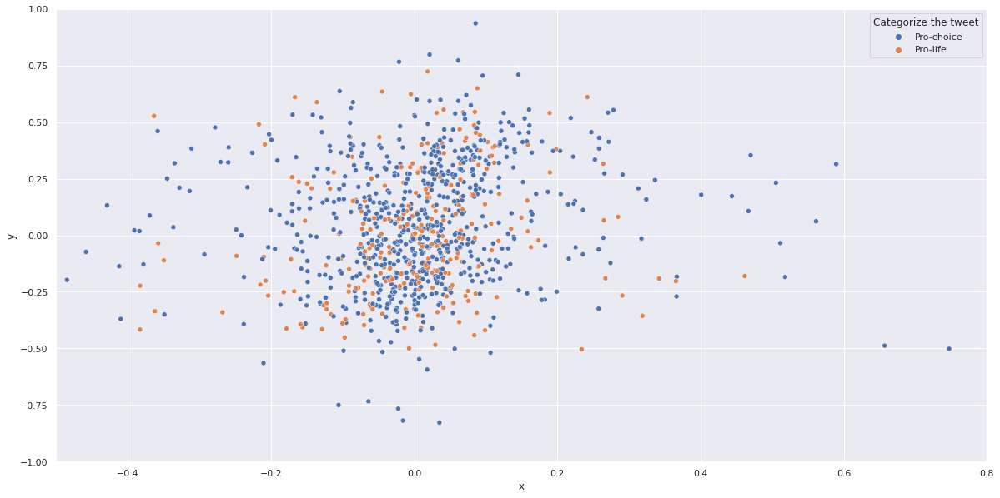

In [ ]:
g_set = set(df['Categorize the tweet'])
d = dict(zip(g_set, range(len(g_set))))
colors = [d[g] for g in df['Categorize the tweet']]


plt.figure(figsize=(20,10))
sns.scatterplot(x="x", y="y", hue='Categorize the tweet', data=df)

plt.xlim(-0.5,0.8)
plt.ylim(-1,1)

In [ ]:
pca = PCA(n_components=3)
pcaComp = pca.fit_transform(X)
df = pd.DataFrame(data = pcaComp, columns = ['PCA1', 'PCA2', 'PCA3'])

df = pd.concat([df, df_rw['Categorize the tweet']], axis = 1)
px.scatter_3d(df, x="PCA1", y="PCA2",z="PCA3", color="Categorize the tweet")

#### Topic Models

In [ ]:
sf = tc.SFrame(df_rw[['text', 'Categorize the tweet']])

In [ ]:
import re
from nltk.stem.porter import *
from functools import lru_cache

stemmer = PorterStemmer()
stop_words_set = set(stopwords.words("english"))
def skip_word(w):
    if len(w) <2:
        return True
    if w.isdigit():
        return True
    if 'http' in w:
      return True
    if w in stop_words_set or stemmer.stem(w) in stop_words_set:
        return True
    return False

In [ ]:
tweets = tc.text_analytics.count_words(sf['text'])
tweets = tweets.apply(lambda d: {w:v for w, v in d.items() if not skip_word(w)})

In [ ]:
topic_model = tc.topic_model.create(tweets, num_topics=30)

Learning a topic model

Number of documents      1025

Vocabulary size      5028

Running collapsed Gibbs sampling

+-----------+---------------+----------------+-----------------+

| Iteration | Elapsed Time  | Tokens/Second  | Est. Perplexity |

+-----------+---------------+----------------+-----------------+

| 10        | 97.792ms      | 844648         | 0               |

+-----------+---------------+----------------+-----------------+

In [ ]:
topic_model.get_topics().print_rows(20)

+-------+------------+----------------------+
| topic |    word    |        score         |
+-------+------------+----------------------+
|   0   |    roe     | 0.05793531805525912  |
|   0   |    back    | 0.022595844934675927 |
|   0   |    get     | 0.015099593060612822 |
|   0   |  overturn  | 0.012957806810880506 |
|   0   |     vs     | 0.010816020561148191 |
|   1   |  abortion  |  0.0573558003888544  |
|   1   |   right    | 0.029271980989415334 |
|   1   |    pro     | 0.026031540289480057 |
|   1   |    safe    | 0.008749189889825246 |
|   1   |    stop    | 0.006588896089868395 |
|   2   |   people   | 0.027739410681400345 |
|   2   | overturned | 0.01277624309392298  |
|   2   |     us     | 0.009323204419889743 |
|   2   |   murder   | 0.00817219152854533  |
|   2   |   world    | 0.00817219152854533  |
|   3   |     co     | 0.10173299101412182  |
|   3   |   think    | 0.01401369276850679  |
|   3   |   don’t    | 0.01294394522892612  |
|   3   |    work    | 0.011874197

In [ ]:
docs = sf['text'].apply(lambda txt: [stemmer.stem(w) for w in re.findall(r"(\w+)", txt) if not skip_word(w)])
docs = docs.apply(lambda l: [w for w in l if not skip_word(w)])

# Converting the data to work in Gensim
# see also https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/
id2word = corpora.Dictionary(docs)
corpus = [id2word.doc2bow(text) for text in docs]

In [ ]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=50,
                                           update_every=0,
                                           chunksize=500,
                                           alpha='auto',
                                           per_word_topics=True)

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
25     0.133538  0.043953       1        1  6.654375
17     0.093412  0.118735       2        1  4.359538
12     0.102569  0.017189       3        1  4.272710
22     0.100924  0.019941       4        1  4.148182
1      0.105266 -0.060616       5        1  3.533494
38     0.115641 -0.034977       6        1  3.467860
0      0.069562  0.061474       7        1  2.875872
36     0.060437 -0.023176       8        1  2.804376
42     0.061362 -0.115823       9        1  2.764867
13     0.021454  0.049354      10        1  2.629394
3      0.068948 -0.060585      11        1  2.619357
27     0.066916 -0.089989      12        1  2.545774
48     0.051544 -0.041204      13        1  2.518770
32     0.046325  0.082885      14        1  2.503628
16     0.055121  0.015796      15        1  2.496484
33     0.071595 -0.037588      16        1  2.450493
28     0.053196  0.010948      17        1  2.448541
2      0.018165  0.054753      18        1  2.417703
30     0.077028 -0.018879      19        1  2.417593
14     0.073345  0.056554      20        1  2.397552
37     0.017688  0.093577      21        1  2.337726
40     0.044205 -0.013319      22        1  2.172235
29     0.026353  0.017200      23        1  2.091535
26     0.014201 -0.073566      24        1  1.996500
31     0.012457  0.044203      25        1  1.871586
44    -0.020986  0.006316      26        1  1.714687
6     -0.002710 -0.015142      27        1  1.564788
23    -0.011287  0.021136      28        1  1.547126
34    -0.026806 -0.017877      29        1  1.523954
15    -0.015084 -0.053845      30        1  1.466475
39    -0.015941 -0.052495      31        1  1.436209
8      0.026600 -0.047214      32        1  1.396141
19    -0.057678  0.046753      33        1  1.358588
10    -0.048905  0.075507      34        1  1.324405
21    -0.093443 -0.081950      35        1  1.322596
45    -0.037224  0.034315      36        1  1.160551
9     -0.055252 -0.014519      37        1  1.150759
49    -0.062823  0.003961      38        1  1.142620
7     -0.085832  0.054990      39        1  1.074278
5     -0.074036  0.003020      40        1  1.049950
41    -0.044258 -0.004301      41        1  0.991367
4     -0.065605 -0.075426      42        1  0.990338
46    -0.068066 -0.074147      43        1  0.886814
24    -0.087260  0.061444      44        1  0.886107
35    -0.098293  0.070654      45        1  0.783298
20    -0.088096 -0.085320      46        1  0.655495
18    -0.125315  0.015675      47        1  0.619875
47    -0.104810 -0.013966      48        1  0.525841
43    -0.119884  0.023859      49        1  0.399329
11    -0.178257  0.001732      50        1  0.232261, topic_info=        Term        Freq       Total Category  logprob  loglift
13      wade  260.000000  260.000000  Default  30.0000  30.0000
10       roe  278.000000  278.000000  Default  29.0000  29.0000
62     abort  307.000000  307.000000  Default  28.0000  28.0000
46  overturn  114.000000  114.000000  Default  27.0000  27.0000
5         co  620.000000  620.000000  Default  26.0000  26.0000
..       ...         ...         ...      ...      ...      ...
14      babi    0.005905   29.462890  Topic50  -8.4515  -2.4501
15       die    0.005905    6.898545  Topic50  -8.4515  -0.9982
16   dumbass    0.005905    2.178217  Topic50  -8.4515   0.1546
17    endang    0.005905    1.459286  Topic50  -8.4515   0.5551
18       get    0.005905   52.395840  Topic50  -8.4515  -3.0258

[2954 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
392       7  0.669517  01wzegnac9
286      31  0.712048  0ajylaaonw
443       4  0.651970  0czg6n1qit
2271     19  0.685078  0f7uuzfzzr
723      12  0.686973  0n2yv4be2l
...     ...       ...         ...
3754      1  0.641003  zlnv7cvg3g
2192     25  0.692001  zqokpwyo4h
3801     40  0.740210  zqw8byxxq4
1027     21  0.672676

## Question 2

### Part 1 - Party in the current Knesset

I chose the "Yesh Atid" party to analyze its activities over the past yearץ

####  News Articles Analysis

In [ ]:
end = parser.parse("2022-07-08")
start = end - timedelta(days=365)

delta = (end-start).days

date_list = [start + timedelta(days=x) for x in range(0, delta+1)]
date_tuple_list = list(((date.year, date.month, date.day) for date in date_list))

In [ ]:
datetimes = [datetime(*date) for date in date_tuple_list]
date2nbarticles = {date: 0 for date in date_tuple_list}

for date_t, next2_date_t, date_datetime in tqdm(zip(date_tuple_list[:-2], date_tuple_list[2:], datetimes[:-2])):
  google_news = GNews(start_date=date_t, end_date=next2_date_t)
  yair_lapid_news = google_news.get_news('Yesh Atid')
  nb_articles = len(yair_lapid_news)
  date2nbarticles[date_t] = nb_articles

0it [00:00, ?it/s]

In [ ]:
# Converting to pandas and adding a rolling average

date2nbarticles_df = pd.DataFrame({'Date': datetimes, 'num_new_articles': date2nbarticles.values()})
date2nbarticles_df['7day_rolling_avg'] = date2nbarticles_df['num_new_articles'].rolling(7).mean()
date2nbarticles_df

,Date,num_new_articles,7day_rolling_avg
0,2021-07-08,3,NaN
1,2021-07-09,0,NaN
2,2021-07-10,1,NaN
3,2021-07-11,4,NaN
4,2021-07-12,4,NaN
...,...,...,...
361,2022-07-04,16,11.857143
362,2022-07-05,13,12.285714
363,2022-07-06,12,12.000000
364,2022-07-07,0,10.714286


Text(0.5, 1.0, 'Number of new "Yesh Atid" Articles Published in the Last Year (Google News)')

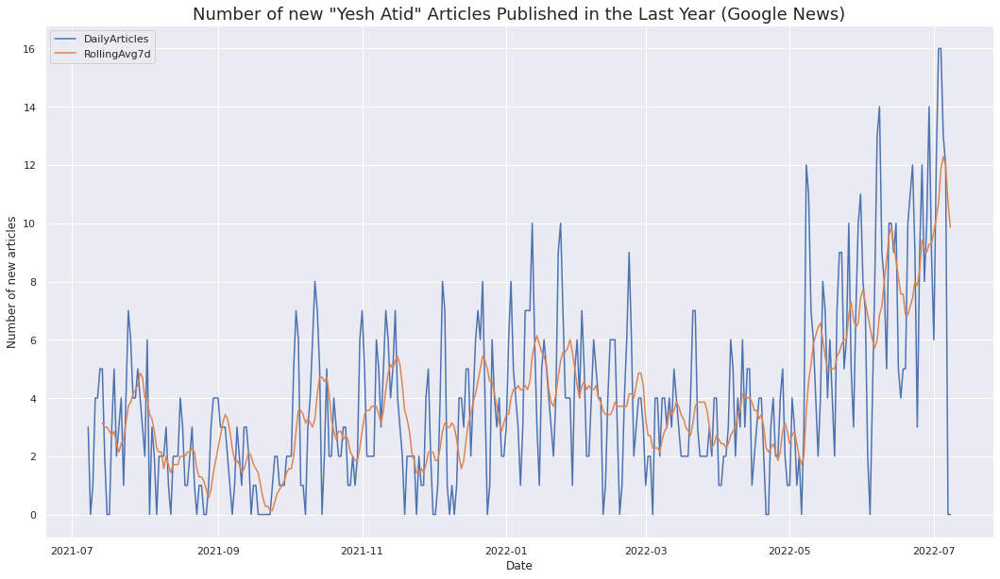

In [ ]:
# set figure size
plt.figure( figsize = (18, 10))

# plot a simple time series plot
# using seaborn.lineplot()
sns.lineplot(x = 'Date',
             y = 'num_new_articles',
             data = date2nbarticles_df,
             label = 'DailyArticles')

# plot using rolling average
sns.lineplot(x = 'Date',
             y = '7day_rolling_avg',
             data = date2nbarticles_df,
             label = 'RollingAvg7d')

plt.xlabel('Date')
plt.ylabel('Number of new articles')
plt.title('Number of new \"Yesh Atid\" Articles Published in the Last Year (Google News)', fontsize=18)

In [ ]:
article_list = []
for date_t, next2_date_t, date_datetime in tqdm(zip(date_tuple_list[:-2], date_tuple_list[2:], datetimes[:-2])):
  google_news = GNews(start_date=date_t, end_date=next2_date_t)
  yair_lapid_news = google_news.get_news('Yesh Atid')
  for a in yair_lapid_news:
    article_list.append([datetime(*date_t), a['title'], a['description']])

0it [00:00, ?it/s]

In [ ]:
# Creating a dataframe from the articles list above
article_df = pd.DataFrame(article_list, columns=['Datetime', 'Title', 'Description'])
article_df

,Datetime,Title,Description
0,2021-07-08,For first time in over 12 years Israeli FM to ...,For first time in over 12 years Israeli FM to ...
1,2021-07-08,Israeli Foreign Minister Yair Lapid Meets With...,Israeli Foreign Minister Yair Lapid Meets With...
2,2021-07-08,Netanyahu shuts down heckler who calls for Ben...,Netanyahu shuts down heckler who calls for Ben...
3,2021-07-08,Should Turkey’s Erdogan fear Israel’s new gove...,Should Turkey’s Erdogan fear Israel’s new gove...
4,2021-07-10,Netanyahu leaves official Israeli prime minist...,Netanyahu leaves official Israeli prime minist...
...,...,...,...
1380,2022-07-06,Five key questions in the early weeks of Israe...,Five key questions in the early weeks of Israe...
1381,2022-07-06,Scoping the Israeli Election Realistically - T...,Scoping the Israeli Election Realistically Th...
1382,2022-07-06,Consternation prevails in the snake pits - Haa...,Consternation prevails in the snake pits Haaretz
1383,2022-07-06,My Take On The News - Yated.com,My Take On The News Yated.com


In [ ]:
# Add the topic of each article and the number of this topic apperance in the article's content. Using bag of words, stemmer and stop words for filtering.
from nltk.stem.porter import *

stemmer = PorterStemmer()
stop_words_set = set(stopwords.words("english"))

def skip_word2(w):
    if len(w) <=2:
        return True
    if w.isdigit():
        return True
    if w in stop_words_set or stemmer.stem(w) in stop_words_set:
        return True
    return False

article_df['Topic'] = article_df['Description'].apply(lambda txt: Counter([w for w in re.findall(r"(\w+)", txt) if w not in stop_words_set and not skip_word2(w)]).most_common(1)[0][0])
article_df['Num_Topic'] = article_df['Description'].apply(lambda txt: Counter([w for w in re.findall(r"(\w+)", txt) if w not in stop_words_set]).most_common(1)[0][1])

article_df

,Datetime,Title,Description,Topic,Num_Topic
0,2021-07-08,For first time in over 12 years Israeli FM to ...,For first time in over 12 years Israeli FM to ...,first,1
1,2021-07-08,Israeli Foreign Minister Yair Lapid Meets With...,Israeli Foreign Minister Yair Lapid Meets With...,Israeli,1
2,2021-07-08,Netanyahu shuts down heckler who calls for Ben...,Netanyahu shuts down heckler who calls for Ben...,Netanyahu,1
3,2021-07-08,Should Turkey’s Erdogan fear Israel’s new gove...,Should Turkey’s Erdogan fear Israel’s new gove...,Israel,2
4,2021-07-10,Netanyahu leaves official Israeli prime minist...,Netanyahu leaves official Israeli prime minist...,Netanyahu,1
...,...,...,...,...,...
1380,2022-07-06,Five key questions in the early weeks of Israe...,Five key questions in the early weeks of Israe...,Five,1
1381,2022-07-06,Scoping the Israeli Election Realistically - T...,Scoping the Israeli Election Realistically Th...,Scoping,1
1382,2022-07-06,Consternation prevails in the snake pits - Haa...,Consternation prevails in the snake pits Haaretz,Consternation,1
1383,2022-07-06,My Take On The News - Yated.com,My Take On The News Yated.com,Take,1


In [ ]:
px.bar(article_df, x="Datetime", y="Num_Topic",color = 'Topic',title="Most mentioned word in the news description related to 'Yesh Atid' party over the past year")

In [ ]:
docs = article_df['Description'].apply(lambda txt: [stemmer.stem(w) for w in re.findall(r"(\w+)", txt) if not skip_word2(w)])
docs = docs.apply(lambda l: [w for w in l if not skip_word2(w)])

# pre processing the data for genism
id2word = corpora.Dictionary(docs)
corpus = [id2word.doc2bow(text) for text in docs]

In [ ]:
# build the model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10,
                                           update_every=0,
                                           chunksize=500,
                                           alpha='auto',
                                           per_word_topics=True)

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.031360 -0.013184       1        1  15.212662
0      0.044123 -0.029985       2        1  13.435299
3      0.055180  0.035188       3        1  13.059888
2      0.036976  0.033141       4        1  12.166225
5      0.028527  0.038521       5        1  11.390785
7      0.072954 -0.027092       6        1  10.141254
8      0.047849 -0.001575       7        1   8.232720
9     -0.088321  0.106660       8        1   7.031897
4     -0.143439 -0.040758       9        1   6.683055
6     -0.022489 -0.100917      10        1   2.646214, topic_info=          Term        Freq       Total Category  logprob  loglift
5         post  329.000000  329.000000  Default  30.0000  30.0000
4    jerusalem  352.000000  352.000000  Default  29.0000  29.0000
28         new  201.000000  201.000000  Default  28.0000  28.0000
11      i24new   61.000000   61.000000  Default  27.0000  27.0000
21      israel  839.000000  839.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
178    knesset    2.105833  123.833943  Topic10  -5.1818  -0.4422
3         isra    2.038288  198.690279  Topic10  -5.2144  -0.9476
61        bill    1.901513   57.516193  Topic10  -5.2839   0.2226
45        talk    1.800060   32.973658  Topic10  -5.3387   0.7242
684        com    1.800023   44.567730  Topic10  -5.3388   0.4228

[748 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
619       4  0.146991      1st
619       5  0.293981      1st
619       7  0.440972      1st
966       4  0.227115      4th
966       5  0.681345      4th
...     ...       ...      ...
936       3  0.175992     zero
936       6  0.175992     zero
203       4  0.228850  zionist
203       8  0.228850  zionist
203      10  0.457700  zionist

[1599 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 4, 3, 6, 8, 9, 10, 5, 7])

In [ ]:
article_df['Month'] = article_df['Datetime'].apply(lambda a: a.date().month)
article_df['Year'] = article_df['Datetime'].apply(lambda a: a.date().year)
grouped_article = article_df.groupby(['Year','Month']).size().reset_index(name='Count')
grouped_article["Date"] = grouped_article[['Year','Month']].apply(lambda d: f'{d.Month}-{d.Year}', axis=1)
grouped_article

,Year,Month,Count,Date
0,2021,7,80,7-2021
1,2021,8,61,8-2021
2,2021,9,43,9-2021
3,2021,10,98,10-2021
4,2021,11,102,11-2021
5,2021,12,99,12-2021
6,2022,1,146,1-2022
7,2022,2,111,2-2022
8,2022,3,87,3-2022
9,2022,4,84,4-2022


In [ ]:
px.bar(grouped_article, x="Date", y="Count",title="Number of news related to 'Yesh Atid' party per month over the pat year")

#### Social Networks Analysis

##### Twitter

In [ ]:
tweets_list = []

for i,tweet in enumerate(sntwitter.TwitterSearchScraper('from:yeshatidparty').get_items()):
    if i>600:
        break
    tweets_list.append([tweet.date, tweet.id, tweet.content, tweet.username])

# Creating a dataframe from the tweets list above
tweets_df = pd.DataFrame(tweets_list, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

tweets_df

07/10/2022 10:23:32 AM - Retrieving guest token from search page
07/10/2022 10:23:32 AM - Retrieving https://twitter.com/search?f=live&lang=en&q=from%3Ayeshatidparty&src=spelling_expansion_revert_click
07/10/2022 10:23:32 AM - Retrieving scroll page None
07/10/2022 10:23:32 AM - Retrieving https://api.twitter.com/2/search/adaptive.json?include_profile_interstitial_type=1&include_blocking=1&include_blocked_by=1&include_followed_by=1&include_want_retweets=1&include_mute_edge=1&include_can_dm=1&include_can_media_tag=1&skip_status=1&cards_platform=Web-12&include_cards=1&include_composer_source=true&include_ext_alt_text=true&include_reply_count=1&tweet_mode=extended&include_entities=true&include_user_entities=true&include_ext_media_color=true&include_ext_media_availability=true&send_error_codes=true&simple_quoted_tweets=true&q=from%3Ayeshatidparty&tweet_search_mode=live&count=100&query_source=spelling_expansion_revert_click&pc=1&spelling_corrections=1&ext=mediaStats%252CcameraMoment
07/10/2

,Datetime,Tweet Id,Text,Username
0,2022-07-10 10:20:39+00:00,1546076930956574720,לימור לבנת: בן גביר הכהניסט וסמוטריץ׳ הגזען וה...,YeshAtidParty
1,2022-07-09 15:13:30+00:00,1545788238543163394,מהלך חשוב וחזק של הנשיא ביידן! הנשיא מגן על זכ...,YeshAtidParty
2,2022-07-08 14:00:09+00:00,1545407393361797122,כלכך שכחנו איך זה מרגיש שיש ראש ממשלה שאוהב ור...,YeshAtidParty
3,2022-07-08 12:24:09+00:00,1545383232568496131,"כאמור, הארכיון לא שוכח 👇🏼🤥 https://t.co/rjWyMJ...",YeshAtidParty
4,2022-07-06 16:12:28+00:00,1544715917510205442,קלעו בול בפוני! 👊🏼 https://t.co/khBM8eiaZU,YeshAtidParty
...,...,...,...,...
596,2021-01-07 16:51:46+00:00,1347224419547156485,"נפתלי נו די כבר, על מי אתה בא לעבוד? \nלא לשבת...",YeshAtidParty
597,2021-01-05 19:10:57+00:00,1346534672407343110,״אני עומדת כאן היום על מנת להודיע שאני מצטרפת ...,YeshAtidParty
598,2021-01-05 19:00:06+00:00,1346531938379722753,"""מירב הצטרפה אלינו מפני שרק יש עתיד גדולה וחזק...",YeshAtidParty
599,2021-01-05 18:59:37+00:00,1346531819152355333,"""הבחירות יהיו על הדבר האמיתי. על השאלה איזו מד...",YeshAtidParty


In [ ]:
yeshatid_tweets_df_g = tweets_df.groupby([tweets_df['Datetime'].dt.date]).size().reset_index(name='counts')
yeshatid_tweets_df_g.head()

,Datetime,counts
0,2021-01-05,4
1,2021-01-07,1
2,2021-01-08,5
3,2021-01-09,1
4,2021-01-10,2


In [ ]:
plt.figure(figsize = (18, 10))
fig = px.line(yeshatid_tweets_df_g, x="Datetime", y="counts", text="counts", title="Number of tweets in 'Yesh Atid' Twitter per day in the past year")
fig.update_traces(textposition="bottom right")
fig.show()

<Figure size 1296x720 with 0 Axes>

As we can see there is a significant peak on March 23, 2021, two days before the 24th Knesset elections.
It seems that in the few months before there is activity on the Twitter of Yesh Atid (dozens of tweets a day), with two days before the election reaching a significant peak.
After the election and as time goes on it seems that the number of tweets decreases and the party publishes individual tweets a day.

In [ ]:
# 23.3.2021 posts
d = datetime(2021, 3, 23).date()
for index, row in tweets_df.iterrows():
  if row["Datetime"].date() == d:
    print(f'tweet number {index} : {row["Text"]}')

tweet number 271 : 🟠🟠שעה אחרונה לבחירות🟠🟠
זו שעת האמת, תרימו טלפון לכל חבר, בן משפחה, מכר, או שכן שאתם חושדים שלא הצביעו ותשכנעו אותם ללכת לקלפי ולבחור ביש עתיד!
חייבים לצאת ולשנות את המדינה, חייבים להחזיר את השפיות. דואגים שכל מי שעוד לא הלך יגיע לקלפי וישים "פה" כדי שיהיה יותר טוב פה!🟠
tweet number 272 : ״מקווה שהניצחון יהיה הלילה של יש עתיד״. 
הירש ליטמנוביץ׳ עולה חדש מפרו בן 90, ניצול שואה ממחנה ההשמדה אושוויץ, שהצביע היום ליש עתיד במודיעין 🧡

כדי להביא את המנדט ה61 חייבים לצאת ולהצביע. נשארו פחות משעתיים! 🟠 https://t.co/4Z8ym1EAxH
tweet number 273 : בלי יש עתיד גדולה לא יהיה שינוי גדול. 
צאו להצביע! 🟠 https://t.co/T6fHLtcOaA
tweet number 274 : 🟠 https://t.co/MAnYhhOhtt
tweet number 275 : חברים מנדט אחד. אחד! זה מה שמפריד בינינו ובין ניצחון. בין ממשלה שפויה וליברלית לממשלת חושך של ליצמן, בן גביר, סמוטריץ׳ ודרעי. 
צאו עכשיו להצביע 🟠 https://t.co/0wW43dMgtG
tweet number 276 : המנדט ה61 בהישג יד. 
זה תלוי רק בכם 🟠 https://t.co/AutG464sSq
tweet number 277 : ״היום אנחנו מביאים את השינוי

##### Facebook

In [ ]:
!pip install facebook-scraper
!pip install browser-cookie3

In [ ]:
from facebook_scraper import get_posts

In [ ]:
nb_posts = 600
yeshatid_fb_gen = get_posts('yeshatidparty', pages=100, cookies='./facebook_cookies.txt')
yeshatid_fb_1000_posts = list(itertools.islice(yeshatid_fb_gen, nb_posts)) # grab the first 1000 elements

In [ ]:
yeshatid_fb_1000_posts_small = []

for post in yeshatid_fb_1000_posts:
  yeshatid_fb_1000_posts_small.append({k: post[k] for k in ['time', 'comments', 'likes', 'post_text']})

In [ ]:
yeshatid_fb_posts_df = pd.DataFrame(yeshatid_fb_1000_posts_small)
yeshatid_fb_posts_df = yeshatid_fb_posts_df[yeshatid_fb_posts_df['post_text'] != '']
yeshatid_fb_posts_df['comments+likes'] = yeshatid_fb_posts_df['comments'] + yeshatid_fb_posts_df['likes']
yeshatid_fb_posts_df

,time,comments,likes,post_text,comments+likes
2,2022-07-07 14:53:52,25,334,הגיע הזמן שנהפוך את ערד לסמל לפוטנציאל האדיר ש...,359
3,2022-07-07 07:51:07,88,578,אנחנו רק צריכים לעשות את זה יחד.\nYair Lapid -...,666
4,2022-07-06 05:59:26,23,215,"תעשו הרבה כבוד לחברתנו, אבירת איכות השלטון לשנ...",238
5,2022-07-05 17:18:58,120,1700,מסכימים איתך!,1820
6,2022-07-05 14:40:46,31,579,ראש הממשלה Yair Lapid - יאיר לפיד בפגישה עם נש...,610
...,...,...,...,...,...
590,2021-05-04 18:33:55,29,653,הגיע הזמן לממשלת אחדות ישראלית שתעבוד בשביל הצ...,682
593,2021-04-29 07:52:07,37,77,"שוויון זכויות, סובלנות ואחדות.\nלינק לטור המלא...",114
595,2021-04-27 07:59:40,14,281,"אמיר זיסקינד,‏ ראש מטה השטח מחוז צפון‏ ביש עתי...",295
598,2021-04-22 13:39:25,6,50,לכבוד יום כדור הארץ חבר הכנסת יוראי להב הרצנו ...,56


In [ ]:
yeshatid_fb_posts_df_g = yeshatid_fb_posts_df.groupby([yeshatid_fb_posts_df['time'].dt.date])
yeshatid_fb_posts_df_agg = yeshatid_fb_posts_df_g.agg(
                                                      avg_likes_comments=('comments+likes', np.mean),
                                                      number_of_posts=('comments+likes', len))
# date2comments_likes_series = yeshts_df_g['comments+likes'].count()
yeshatid_fb_posts_df_agg.head()

,avg_likes_comments,number_of_posts
time,,
2021-04-22,228.0,2
2021-04-27,295.0,1
2021-04-29,114.0,1
2021-05-04,682.0,1
2021-05-05,657.0,1


In [ ]:
plt.figure( figsize = (30, 20))
fig = px.line(yeshatid_fb_posts_df_agg, x=yeshatid_fb_posts_df_agg.index, y="number_of_posts", text="number_of_posts", title="Number of posts in 'Yesh Atid' Facebook page per day in the past year")
fig.update_traces(textposition="bottom right")
fig.show()

<Figure size 2160x1440 with 0 Axes>

As we can see from the plot the number of posts that Yair Lapid posts on his Facebook page is consistent, but if we look at the dates 13.6.2021 and 23.5.2022 it seems that there were jumps in the number of posts - 5 posts these days.
It will be interesting to see the posts posted these days.

In [ ]:
# 13.6.2021 posts
d1 = datetime(2021, 6, 13).date()
for index, row in yeshatid_fb_posts_df.iterrows():
  if row["time"].date() == d1:
    print(f'post number {index} : {row["post_text"]}')

2021-06-13
post number 531 : באנו לשנות.
post number 532 : עם כניסתי לתפקיד בכוונתי להניף את דגל הממלכתיות. אני מתחייב לייצג את הכנסת כולה. את כלל סיעותיה וחבריה ולשמור על מעמדה על עצמאותה ועל תפקודה הראוי.
Mickey Levy - מיקי לוי
post number 533 : אני רוצה לבקש סליחה מאימא שלי, רציתי שהיא תהיה גאה בהליך הדמוקרטי הישראלי
Yair Lapid - יאיר לפיד
post number 534 : צפו בשידור חי של מליאת הכנסת להשבעת הממשלה השלושים ושש>>
post number 535 : ישיבת ראשי הסיעות.
עובדים למענכם.


This is indeed a significant day, on this date the thirty-sixth government of Israel, sworn in by Naftali Bennett and Yair Lapid, was sworn in.

In [ ]:
# 23.5.2022 posts
d2 = datetime(2022, 5, 23).date()
for index, row in yeshatid_fb_posts_df.iterrows():
  if row["time"].date() == d2:
    print(f'post number {index} : {row["post_text"]}')

post number 65 : הלילה הזה הוא בשבילכם, לוחמות ולוחמי צבא ההגנה לישראל.
לילה טוב 🇮🇱💪🏻
post number 66 : בושה!
Miri Regev מירי רגב יובל שטייניץ - Yuval Steinitz
post number 67 : מירי, אל תעשי פוליטיקה קטנה על הגב של חיילי צה״ל!
להצביע נגד חוק ׳ממדים ללימודים׳ זה להצביע נגד הלוחמים שלנו.
אלו שמסכנים יום יום את החיים שלהם ולא יקבלו מה שמגיע להם.

Miri Regev מירי רגב
post number 69 : ברגעים אלו צעירי יש עתיד מפגינים מחוץ לכנסת ודורשים יחד עם השרים והח"כים שלנו לשים את הפוליטיקה בצד.
למען לוחמי ולוחמות צה״ל אין קואליציה ואופוזיציה.

אורנה ברביבאי - Orna Barbivay יוראי להב הרצנו - Yorai Lahav Hertzanu אלעזר שטרן Elazar stern ולדימיר בליאק - Vladimir Beliak Idan Roll - עידן רול רון כץ - Ron Katz טטיאנה מזרסקי - Tatiana Mazarsky
post number 70 : אל תעשו פוליטיקה על חשבון הלוחמים שלנו.


The opposition voted against the "Dimensions for Education" law, which is significant for Israeli Defense Forces soldiers.

In [ ]:
plt.figure( figsize = (30, 20))
fig = px.scatter(yeshatid_fb_posts_df_agg, x=yeshatid_fb_posts_df_agg.index, y="avg_likes_comments", size="avg_likes_comments", size_max=60, title="Average likes and comments on 'Yesh Atid' posts in Facebook page per day in the past year")
fig.show()

<Figure size 2160x1440 with 0 Axes>

As we can see, on June 11, 2002, Yair Lapid received the most likes and comments.

In [ ]:
# 11.6.2022 posts
d3 = datetime(2022, 6, 11).date()
for index, row in yeshatid_fb_posts_df.iterrows():
  if row["time"].date() == d3:
    print(f'post number {index} : {row["post_text"]}')

post number 37 : מכונת השקרים של נתניהו עובדת שעות נוספות

בנימין נתניהו פרסם אתמול, לא בפעם הראשונה, פוסט שעוסק בי באופן אובססיבי. הפעם הוא שיתף פוסט של שי גולדן שאפילו במונחים שלו, שזה לא קל, מכיל כמות שקרים מרשימה במיוחד. למען הסדר הטוב, החלטתי לענות לו הפעם. בפוסט המדובר הופיעו שלושה שקרים גסים ובוטים, אז כשירות לקהל הנה גם האמת:

1. לטענתם חשף ערוץ 14 את יומן הפגישות שלי אשר מוכיח שאני עובד רק כמה שעות ביום, אבל נפגשתי עם 30 עתונאים בחצי שנה. אם ערוץ 14 היה עוסק בעתונות, הוא היה יודע להבדיל בין עבודה ליומן פגישות. ביום שני האחרון, סתם לדוגמא, בשעה 2:42 לפנות בוקר עוד הייתי בכנסת, אז העברתי את "חוק אנשים עם מוגבלויות ובני משפחותיהם". כל זה לא מופיע כמובן ביומן הפגישות, כי זה יומן שיש בו רק, נו, פגישות. לא מופיעה שם גם העובדה שבשש בבוקר אני קורא חומר מודיעיני, או עשרות השעות שבהן אני עובד במשרד החוץ. בקיצור, אין שום קשר בין היומן הזה לבין השאלה כמה שעות אני עובד. אגב, חלק מהעבודה שלי הוא באמת להפגש עם עתונאים. להבדיל מנתניהו אין לי ערוצי תקשורת שקנו לי אוליגרכים מפוקפקים (כמו ערוץ 1

In this post, it seems that Yair Lapid is writing a harsh response to Bibi Netanyahu, after publishing a post about him.

### Part 2 - Member of Knesset

The chosen politician is Yair Lapid.

#### News Articles Analysis

In [ ]:
end = parser.parse("2022-07-08")
start = end - timedelta(days=365)

delta = (end-start).days

date_list = [start + timedelta(days=x) for x in range(0, delta+1)]
date_tuple_list = list(((date.year, date.month, date.day) for date in date_list))

In [ ]:
datetimes = [datetime(*date) for date in date_tuple_list]
date2nbarticles = {date: 0 for date in date_tuple_list}

for date_t, next_date_t, date_datetime in tqdm(zip(date_tuple_list[:-1], date_tuple_list[1:], datetimes[:-1])):
  google_news = GNews(start_date=date_t, end_date=next_date_t)
  yair_lapid_news = google_news.get_news('Yair Lapid')
  nb_articles = len(yair_lapid_news)
  date2nbarticles[date_t] = nb_articles

365it [03:47,  1.60it/s]


Text(0.5, 1.0, 'Number of New "Yair Lapid" Articles Per Day in the Last Year')

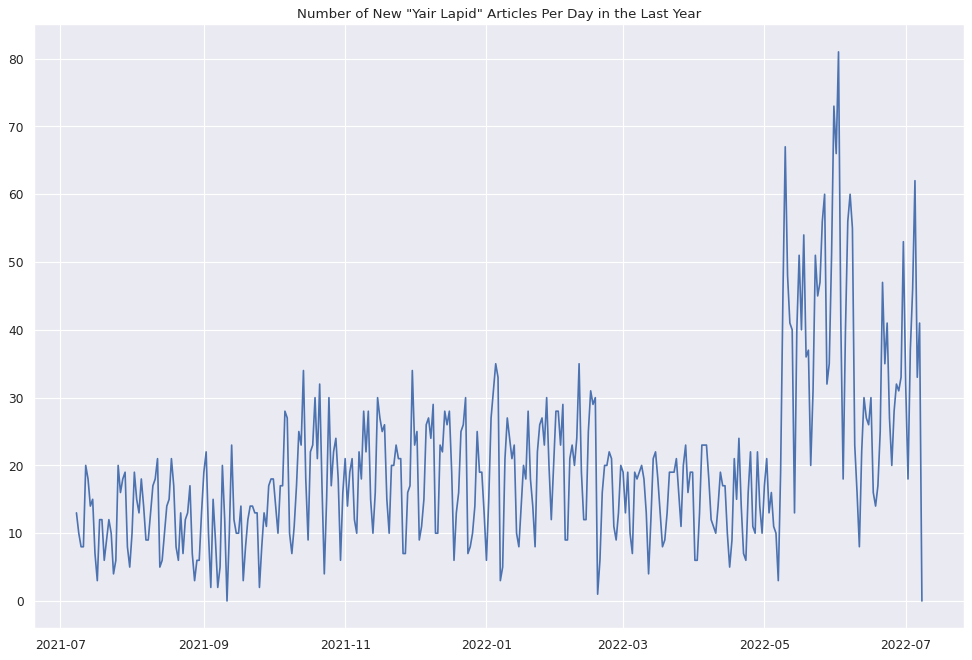

In [ ]:
figure(figsize=(15, 10), dpi=80)
sns.lineplot(x=datetimes, y=date2nbarticles.values()).set_title("Number of New \"Yair Lapid\" Articles Per Day in the Last Year")

#### Social Networks Analysis

##### Twitter

In [ ]:
tweets_yl_list = []

for i,tweet in enumerate(sntwitter.TwitterSearchScraper('from:yairlapid').get_items()):
    if i>600:
        break
    tweets_yl_list.append([tweet.date, tweet.id, tweet.content, tweet.username])

# Creating a dataframe from the tweets list above
tweets_yl_df = pd.DataFrame(tweets_yl_list, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

tweets_yl_df

07/10/2022 11:17:21 AM - Retrieving guest token from search page
07/10/2022 11:17:21 AM - Retrieving https://twitter.com/search?f=live&lang=en&q=from%3Ayairlapid&src=spelling_expansion_revert_click
07/10/2022 11:17:21 AM - Retrieving scroll page None
07/10/2022 11:17:21 AM - Retrieving https://api.twitter.com/2/search/adaptive.json?include_profile_interstitial_type=1&include_blocking=1&include_blocked_by=1&include_followed_by=1&include_want_retweets=1&include_mute_edge=1&include_can_dm=1&include_can_media_tag=1&skip_status=1&cards_platform=Web-12&include_cards=1&include_composer_source=true&include_ext_alt_text=true&include_reply_count=1&tweet_mode=extended&include_entities=true&include_user_entities=true&include_ext_media_color=true&include_ext_media_availability=true&send_error_codes=true&simple_quoted_tweets=true&q=from%3Ayairlapid&tweet_search_mode=live&count=100&query_source=spelling_expansion_revert_click&pc=1&spelling_corrections=1&ext=mediaStats%252CcameraMoment
07/10/2022 11:1

,Datetime,Tweet Id,Text,Username
0,2022-07-10 09:22:46+00:00,1546062362846822400,לראשונה בתולדות המדינה - אישרנו היום בממשלה הח...,yairlapid
1,2022-07-10 08:57:13+00:00,1546055932572049409,הממשלה אישרה החלטה של @omerbarlev ו @cohen_mei...,yairlapid
2,2022-07-10 08:48:32+00:00,1546053749596164097,הממשלה אישרה היום פה אחד את המינוי של @nyschul...,yairlapid
3,2022-07-09 18:38:21+00:00,1545839793787084801,"Tonight, I spoke with His Majesty @KingAbdulla...",yairlapid
4,2022-07-09 17:53:35+00:00,1545828526984675328,"שוחחתי הערב עם מלך ירדן @KingAbdullahII, בירכת...",yairlapid
...,...,...,...,...
596,2022-03-14 17:26:02+00:00,1503422214997417991,"ממשיכים לסייע לעם האוקראיני.\nמש״ב, סוכנות הסי...",yairlapid
597,2022-03-14 13:31:26+00:00,1503363172350181377,Israel &amp; Slovakia have had strong ties for...,yairlapid
598,2022-03-14 13:31:25+00:00,1503363167887450119,"Earlier today, I met with the President of Slo...",yairlapid
599,2022-03-14 11:34:38+00:00,1503333778927886342,"סיימתי פגישה עם נשיאת סלובקיה, @ZuzanaCaputova...",yairlapid


In [ ]:
yairlapid_tweets_df_g = tweets_yl_df.groupby([tweets_yl_df['Datetime'].dt.date]).size().reset_index(name='counts')
yairlapid_tweets_df_g.head()

,Datetime,counts
0,2022-03-14,5
1,2022-03-15,6
2,2022-03-16,3
3,2022-03-17,12
4,2022-03-18,16


In [ ]:
plt.figure(figsize = (18, 10))
fig = px.line(yairlapid_tweets_df_g, x="Datetime", y="counts", text="counts", title="Number of tweets in Yair Lapid's Twitter per day in the past year")
fig.update_traces(textposition="bottom right")
fig.show()

<Figure size 1296x720 with 0 Axes>

As we can see there is a little peak on March 23, 2022.

In [ ]:
# 27.3.2022 posts
d = datetime(2022, 3, 27).date()
for index, row in tweets_yl_df.iterrows():
  if row["Datetime"].date() == d:
    print(f'tweet number {index} : {row["Text"]}')

tweet number 512 : פיגוע הטרור המתועב הערב הוא ניסיון של קיצונים אלימים להטיל אימה ולפגוע במרקם החיים כאן. אני שולח תנחומים למשפחות הנרצחים, ואיחולי החלמה לפצועים. מדינת ישראל תאבק באופן בלתי מתפשר בטרור, נעמוד ביחד בנחישות עם בעלות בריתנו נגד כל מי שינסה לפגוע בנו.
tweet number 513 : עדכנתי את שרי החוץ המשתתפים ב׳פיסגת הנגב׳, בפרטי הפיגוע בחדרה. כל שרי החוץ גינו את הפיגוע וביקשו לשלוח תנחומים למשפחות ואיחולי החלמה לפצועים.
tweet number 514 : ברוך הבא ל #פסגת_הנגב - שר החוץ של מרוקו נאסר בוריטה 🇲🇦🇮🇱
أهلا بك في قمة النقب - وزير خارجية مملكة المغرب ناصر بوريطة 
Welcome to The #Negev_Summit, Moroccan Foreign Minister Nasser Bourita

📸רפי בן חקון, לע״מ https://t.co/mmD7eukJ0J
tweet number 515 : ברוך הבא ל #פסגת_הנגב - שר החוץ של איחוד האמירויות השייח׳ עבדאללה בן זאיד 🇦🇪🇮🇱
أهلا بك في قمة النقب - وزير خارجية دولة الإمارات العربية المتحدة الشيخ عبدالله بن زايد
Welcome to The #Negev_Summit, Emirati Foreign Minister H.H. Sheikh @ABZayed 

📸 בועז אופנהיים, אסי אפרתי, לע״מ https://t.co/VX5MMYYxkG

On this date, the **Negev Summit** was held, the founding meeting of an annual conference in which **Yair Lapid met for the first time in Israel** with US Secretary of State Antony Blinken, along with four other foreign ministers from Arab countries, as part of Israeli-Arab cooperation against Iran.


##### Facebook

In [ ]:
nb_posts = 600
yairlapid_fb_gen = get_posts('yairlapid', pages=100, cookies='./facebook_cookies.txt')
yairlapid_fb_1000_posts = list(itertools.islice(yairlapid_fb_gen, nb_posts)) # grab the first 1000 elements

In [ ]:
yairlapid_fb_1000_posts_small = []

for post in yairlapid_fb_1000_posts:
  yairlapid_fb_1000_posts_small.append({k: post[k] for k in ['time', 'comments', 'likes', 'post_text']})

In [ ]:
yairlapid_fb_posts_df = pd.DataFrame(yairlapid_fb_1000_posts_small)
yairlapid_fb_posts_df = yairlapid_fb_posts_df[yairlapid_fb_posts_df['post_text'] != '']
yairlapid_fb_posts_df['comments+likes'] = yairlapid_fb_posts_df['comments'] + yairlapid_fb_posts_df['likes']
yairlapid_fb_posts_df

,time,comments,likes,post_text,comments+likes
1,2022-07-10 08:51:34,278,2500,שבוע טוב לכם מישיבת הממשלה.,2778
2,2022-07-08 12:50:51,291,2700,חג אדחא שמח לחברינו המוסלמים והדרוזים!\nأضحى م...,2991
3,2022-07-08 11:26:36,214,3900,"בשם ממשלת ישראל ועם ישראל, אני שולח את תנחומיי...",4114
4,2022-07-08 07:52:26,1100,6200,העוצמה הישראלית היא העוצמה של הביחד>\n\nהנאום ...,7300
5,2022-07-07 16:27:03,473,7000,"קצינים וקצינות, מדינת ישראל גאה בכם מאוד. בשם ...",7473
...,...,...,...,...,...
595,2021-09-25 13:36:40,582,1700,הממשלה הזו קיימת רק 100 ימים. היא כבר שינתה את...,2282
596,2021-09-25 08:18:15,220,1300,משהו אחר לשבת.\n--\nרגע מתוך ההופעה ל-40 שנה ל...,1520
597,2021-09-24 04:01:42,432,1600,"הודיה, ברוכה הבאה הביתה! חיכינו לך!",2032
598,2021-09-23 18:07:30,325,2200,בית הנבחרים האמריקאי אישר - מיליארד דולר לכיפת...,2525


In [ ]:
yairlapid_fb_posts_df_g = yairlapid_fb_posts_df.groupby([yairlapid_fb_posts_df['time'].dt.date])
yairlapid_fb_posts_df_agg = yairlapid_fb_posts_df_g.agg(
                                                      avg_likes_comments=('comments+likes', np.mean),
                                                      number_of_posts=('comments+likes', len))
yairlapid_fb_posts_df_agg.head()

,avg_likes_comments,number_of_posts
time,,
2021-09-23,2770.5,2
2021-09-24,2032.0,1
2021-09-25,3734.0,3
2021-09-26,1593.0,2
2021-09-27,17826.5,2


In [ ]:
plt.figure( figsize = (30, 20))
fig = px.line(yairlapid_fb_posts_df_agg, x=yairlapid_fb_posts_df_agg.index, y="number_of_posts", text="number_of_posts", title="Number of posts in Yair Lapid's Facebook page per day in the past year")
fig.update_traces(textposition="bottom right")
fig.show()

<Figure size 2160x1440 with 0 Axes>

As we can see, the number of posts published by Yair Lapid stands between 1-6 per day. It seems that on June 13, 2021, Yair Lapid published 9 posts (the largest number of posts in the past year). It is interesting to check what event was on this date.

In [ ]:
# 27.3.2022 posts
d = datetime(2022, 3, 27).date()
for index, row in yairlapid_fb_posts_df.iterrows():
  if row["time"].date() == d:
    print(f'post number {index} : {row["post_text"]}')

post number 244 : הלב נשבר
—
לוחמת מג״ב, שיראל אבוקרט, ולוחם מג״ב, יזן פלאח נרצחו בידי מחבלים נתעבים.

מהתמונות שלהם רואים את המוטיבציה והאהבה שלהם לתפקיד אליו התגייסו, מלאים בגאוות יחידה להגן על המדינה.
שולח חיבוק וניחומים למשפחתם.

יהי זכרם ברוך.
post number 245 : ‏🇮🇱🇺🇸🇦🇪🇧🇭🇲🇦🇪🇬
post number 246 : עדכנתי את שרי החוץ המשתתפים ב׳פיסגת הנגב׳, בפרטי הפיגוע בחדרה. כל שרי החוץ גינו את הפיגוע וביקשו לשלוח
תנחומים למשפחות ואיחולי החלמה לפצועים.

פיגוע הטרור המתועב הערב הוא ניסיון של קיצונים אלימים להטיל אימה ולפגוע במרקם החיים כאן. אני שולח תנחומים למשפחות הנרצחים, ואיחולי החלמה לפצועים. מדינת ישראל תאבק באופן בלתי מתפשר בטרור, נעמוד ביחד בנחישות עם בעלות בריתנו נגד כל מי שינסה לפגוע בנו.
post number 247 : ברוך הבא ל #פסגת_הנגב - שר החוץ של מצרים סאמח שכרי 🇪🇬🇮🇱

أهلا بك في قمة النقب - وزير خارجية مصر سامح شكري

‏Welcome to The #Negev_Summit, Egyptian Foreign
Minister Sameh Shoukry

📸 בועז אופנהיים, לע״מ
אסי אפרתי, לע״מ
post number 248 : ברוך הבא ל #פסגת_הנגב - שר החוץ של איחוד האמירויות השייח׳

On this date, the **Negev Summit** was held, the founding meeting of an annual conference in which **Yair Lapid met for the first time in Israel** with US Secretary of State Antony Blinken, along with four other foreign ministers from Arab countries, as part of Israeli-Arab cooperation against Iran.

In [ ]:
plt.figure( figsize = (30, 20))
fig = px.scatter(yairlapid_fb_posts_df_agg, x=yairlapid_fb_posts_df_agg.index, y="avg_likes_comments", size="avg_likes_comments", size_max=60, title="Average likes and comments on Yair Lapid's posts in Facebook per day in the past year")
fig.show()

<Figure size 2160x1440 with 0 Axes>

As we can see, there are a number of dates when Yair Lapid received a large average amount of likes and comments for posts he published these days:

*   27.9.2021
*   18.11.2021
*   12.5.2022
*   20.5.2022
*   11.6.2022

In [ ]:
dates = yairlapid_fb_posts_df_agg.sort_values(by=['avg_likes_comments'], ascending=False).head(5).index
dates

Index([2022-05-20, 2021-11-18, 2022-05-12, 2022-06-11, 2021-09-27], dtype='object', name='time')

In [ ]:
for d in dates:
  print('----------------------------------------------')
  print(d)
  for index, row in yairlapid_fb_posts_df.iterrows():
    if row["time"].date() == d:
      print(f'post number {index} : {row["post_text"]}')

----------------------------------------------
2022-05-20
post number 128 : אמרו שבחיים לא נקבל את המנדט להקים ממשלה – קיבלנו.
אמרו שהממשלה לעולם לא תקום – קמה.
אמרו שהיא לא תשרוד את החודש הראשון – שרדה.
אמרו שלא נצליח להעביר תקציב – עבר.
אמרו שלא נגיע למושב הקיץ – הגענו.
אמרו שלא נתאושש מפרישת סילמן – התאוששנו.
הספידו אותנו כבר חמש פעמים ביום שידורים מיוחד – וחזרנו.
עכשיו אותם אנשים אומרים לכם שהכל נגמר – לא נגמר. אנחנו כאן.

הממשלה הזו היא הדבר הנכון למדינת ישראל ולעם ישראל. אין לנו שום כוונה להכנע או לוותר עליה. אין לנו שום כוונה לתת לביבי ובן גביר הזדמנות להרוס את המדינה. נעשה מה שאנחנו עושים כל פעם מחדש: נשב עם מי שצריך לשבת, נתקן כל מה שצריך לתקן.

ועוד מילה אחת לחברים שלי בקואליציה: כן, לפעמים זה קשה. אתם יודעים מה, זה אמור להיות קשה. לשנות את ההיסטוריה זו לא משימה קלה. אנחנו עושים משהו שהוא גדול מכולנו. מצילים את מדינת ישראל, את הדמוקרטיה שלנו. יש כוחות גדולים – ואפלים - שנאבקים בנו. עד עכשיו ניצחנו אותם – נגד כל הסיכויים – כי היינו נחושים ועבדנו יחד. זה מה שאנחנו הולכים לעשות 

**27.9.2021:** Yair Lapid's son got engaged to his partner.

**18.11.2021:** Natalie and Mordi Oknin, the Israeli couple who photographed the residence of Turkish President Erdogan, returned to Israel.

**12.5.2022:** Birthday of Yair Lapid's wife.

**20.5.2022:** Zoabi's retirement.

**11.6.2022:** Yair Lapid is writing a harsh response to Bibi Netanyahu, after publishing a post about him.


## Question 3

### The Data Collection Process



1.   Using the Twitter API, I collected all the tweets that retrived from the query #dalle2.
2.   From the tweets retrieved, I saved the the image path found in the tweet.



In [ ]:
# twitter
TWITTER_API_KEY = ''
TWITTER_API_SECRET_KEY = ''
TWITTER_BEARER_TOKEN = ''

TWITTER_URL = 'https://api.twitter.com/2/tweets/search/recent'

In [ ]:
def create_headers(bearer_token):
    headers = {"Authorization": "Bearer {}".format(bearer_token)}
    return headers

def connect_to_endpoint(url, headers, params):
    response = requests.request("GET", url, headers=headers, params=params)
    if response.status_code != 200:
        raise Exception(response.status_code, response.text)
    return response.json()

In [ ]:
# json for all the tweets
FILE = 'response_dalle.json'

# csv for images
CSV_FILE = 'images.csv'

with open(CSV_FILE, 'w') as csvfile:
    fieldnames = ['media_key','image_url']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writeheader()

# twitter GET request parameters
query_params = {
    'query': '(#dalle2) has:media',
    'tweet.fields': 'text,attachments,author_id,created_at,entities',
    'expansions': 'attachments.media_keys',
    'media.fields': 'url',
    'start_time': '2022-06-29T09:50:01.000Z',
    'end_time': '2022-07-05T17:30:00.000Z'
}

In [ ]:
def get_images_tweets():
    """
    Pull tweets and and put them in a text file.
    :return: None
    """

    headers = create_headers(TWITTER_BEARER_TOKEN)
    json_response = connect_to_endpoint(TWITTER_URL, headers,
                                        query_params)

    json_file = open(FILE, mode='a')
    json_file.write('{"data": [')
    json_file.writelines(json.dumps(json_response["data"])[1:-1])

    # write to csv
    with open(CSV_FILE, 'a') as csvfile:
      fieldnames = ['media_key','image_url']
      writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
      for m in json_response["includes"]["media"]:
        writer.writerow({'media_key': m["media_key"],  'image_url': m["url"]})

    print(json_response["meta"]["newest_id"])

    counter = 0
    tweets_counter = 0
    tweets_counter += json_response["meta"]["result_count"]

    while "next_token" in json_response["meta"].keys():
      if tweets_counter == 100:
        break
      query_params["next_token"] = json_response["meta"]["next_token"]
      sleep(2)
      json_response = connect_to_endpoint(TWITTER_URL, headers, query_params)
      # write to json
      json_file.writelines("," + json.dumps(json_response["data"])[1:-1])

      # write to csv
      with open(CSV_FILE, 'a') as csvfile:
        fieldnames = ['media_key','image_url']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        for m in json_response["includes"]["media"]:
          if "url" not in m.keys():
            continue
          writer.writerow({'media_key': m["media_key"],  'image_url': m["url"]})

      print(json_response["meta"]["newest_id"])
      counter += 1
      tweets_counter += json_response["meta"]["result_count"]

    json_file.writelines("]}")
    json_file.close()

In [ ]:
get_images_tweets()

1544373037855801350
1544371522210594816
1544370224358719490
1544369359925256192
1544368164070457344
1544366878365306880
1544366226755002373
1544365504579739649
1544365239009157120
1544363880364769280


In [ ]:
dalle_df = pd.read_csv('/content/images.csv')
dalle_df = dalle_df.drop_duplicates()
dalle_df

,media_key,image_url
0,3_1544373033971945474,https://pbs.twimg.com/media/FW63F4qXEAI87FX.jpg
1,3_1544373033959411715,https://pbs.twimg.com/media/FW63F4nX0AM1qAV.jpg
2,3_1544369555333853184,https://pbs.twimg.com/media/FW6z7ZuaMAAScVy.jpg
3,3_1544044763615223809,https://pbs.twimg.com/media/FW2MiCSWYAEceQH.jpg
4,3_1544372983992619010,https://pbs.twimg.com/media/FW63C-eXEAIkFU5.jpg
...,...,...
89,3_1544346374774341635,https://pbs.twimg.com/media/FW6e2HaWQAMa4Mj.jpg
90,3_1544346113238618112,https://pbs.twimg.com/media/FW6em5HX0AA1jwA.jpg
91,3_1544346113330843648,https://pbs.twimg.com/media/FW6em5dXEAAnlYz.jpg
92,3_1544346113423147008,https://pbs.twimg.com/media/FW6em5zXgAAEEv0.jpg


In [ ]:
Image(url= dalle_df['image_url'][0])

In [ ]:
Image(url= dalle_df['image_url'][40])

In [ ]:
from PIL import Image

# make dir for all images
!mkdir /content/dalle_images
images_path = '/content/dalle_images'


# download the images
for img_url in dalle_df['image_url']:
  img_name = img_url.split('/')[-1]
  wget.download(img_url, f'{images_path}/{img_name}')
  print(f'download {img_url} save {images_path}/{img_name}')

In [ ]:
sf = tc.image_analysis.load_images(images_path, with_path=True)
sf

path,image
/content/dalle_images/FW2MiCSWYAEceQH.jpg ...,Height: 1024 Width: 1024
/content/dalle_images/FW3-BsRWQAIaBZG.jpg ...,Height: 1200 Width: 981
/content/dalle_images/FW4VQ6pXgAEx7Iq.jpg ...,Height: 1024 Width: 1024
/content/dalle_images/FW4VQ7EX0AImu-e.jpg ...,Height: 1024 Width: 1024
/content/dalle_images/FW4lbBNWYAA2bfL.jpg ...,Height: 1200 Width: 1200
/content/dalle_images/FW600ZZXwAIX1jB.png ...,Height: 862 Width: 862
/content/dalle_images/FW600ZbX0AE89ha.jpg ...,Height: 1024 Width: 1024
/content/dalle_images/FW600ZcWIAEeNWV.jpg ...,Height: 1024 Width: 1024
/content/dalle_images/FW600ZfWQAItc61.jpg ...,Height: 1024 Width: 1024
/content/dalle_images/FW600qFXkAMVcO9.jpg ...,Height: 1024 Width: 1024


,path,image
0,/content/dalle_images/FW2MiCSWYAEceQH.jpg,
1,/content/dalle_images/FW3-BsRWQAIaBZG.jpg,
2,/content/dalle_images/FW4VQ6pXgAEx7Iq.jpg,
3,/content/dalle_images/FW4VQ7EX0AImu-e.jpg,
4,/content/dalle_images/FW4lbBNWYAA2bfL.jpg,
5,/content/dalle_images/FW600ZZXwAIX1jB.png,
6,/content/dalle_images/FW600ZbX0AE89ha.jpg,
7,/content/dalle_images/FW600ZcWIAEeNWV.jpg,
8,/content/dalle_images/FW600ZfWQAItc61.jpg,
9,/content/dalle_images/FW600qFXkAMVcO9.jpg,

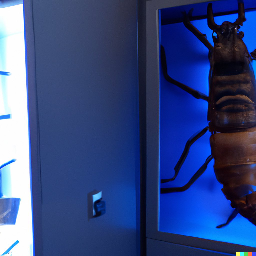
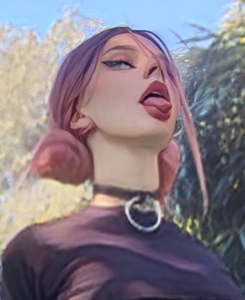
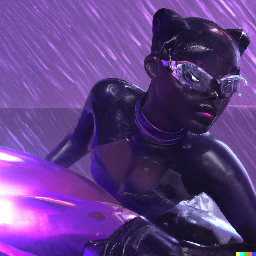
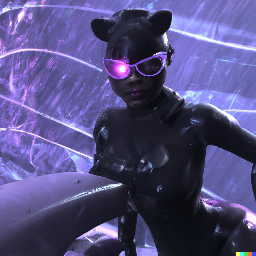
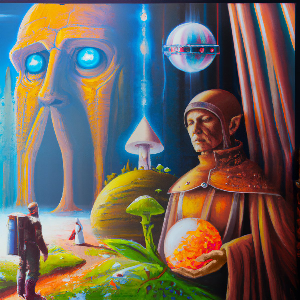
...
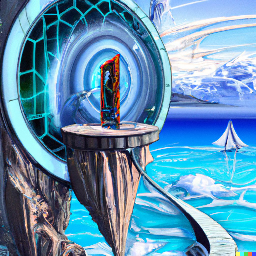
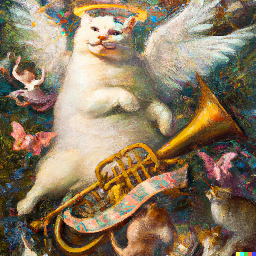
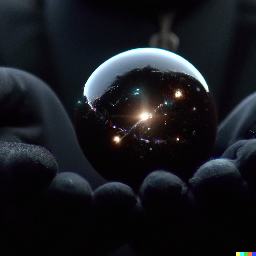
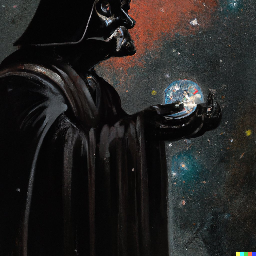
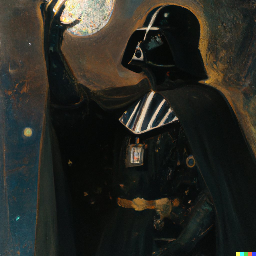

In [ ]:
sf.explore()

### Image Similarity

Using the image features I want to find images that similar to each other.

In [ ]:
from turicreate.toolkits import _image_feature_extractor, _pre_trained_models

def get_images_features_vector(dataset, feature="image", model_name='resnet-50'):
    #ptModel = _pre_trained_models.MODELS[model_name]()
    ptModel = tc.toolkits._pre_trained_models.ResNetImageClassifier()
    feature_extractor = tc.toolkits._image_feature_extractor._create_feature_extractor(model_name)
    extracted_features = tc.SFrame({
        '__image_features__': feature_extractor.extract_features(dataset, feature),
        })
    dataset['image_features'] = extracted_features['__image_features__']
    return dataset

sf = get_images_features_vector(sf)
sf

path,image,image_features
/content/dalle_images/FW2MiCSWYAEceQH.jpg ...,Height: 1024 Width: 1024,"[0.378499835729599, 0.0,0.9098119139671326, ..."
/content/dalle_images/FW3-BsRWQAIaBZG.jpg ...,Height: 1200 Width: 981,"[0.23684872686862946,0.0, 0.5640542507171631, ..."
/content/dalle_images/FW4VQ6pXgAEx7Iq.jpg ...,Height: 1024 Width: 1024,"[0.26754629611968994,0.0, 1.5443449020385742, ..."
/content/dalle_images/FW4VQ7EX0AImu-e.jpg ...,Height: 1024 Width: 1024,"[0.23295706510543823,0.0, 0.6833288073539734, ..."
/content/dalle_images/FW4lbBNWYAA2bfL.jpg ...,Height: 1200 Width: 1200,"[0.1446555107831955, 0.0,0.3614562749862671, ..."
/content/dalle_images/FW600ZZXwAIX1jB.png ...,Height: 862 Width: 862,"[0.056023236364126205,0.0, 1.973447322845459, ..."
/content/dalle_images/FW600ZbX0AE89ha.jpg ...,Height: 1024 Width: 1024,"[0.01964322105050087,0.0, 1.0109801292419434, ..."
/content/dalle_images/FW600ZcWIAEeNWV.jpg ...,Height: 1024 Width: 1024,"[0.08851121366024017,0.0, 1.7776799201965332, ..."
/content/dalle_images/FW600ZfWQAItc61.jpg ...,Height: 1024 Width: 1024,"[0.15937425196170807,0.0, 0.9994478821754456, ..."
/content/dalle_images/FW600qFXkAMVcO9.jpg ...,Height: 1024 Width: 1024,"[0.1508941352367401, 0.0,0.24945132434368134, ..."


In [ ]:
sf.save('./dalle_images.sframe')

In [ ]:
#  use KNN to find similar pictures of a given image
knn_model = tc.nearest_neighbors.create(sf, features=["image_features"])

Starting brute force nearest neighbors model training.

Validating distance components.

Initializing model data.

Initializing distances.

Done.

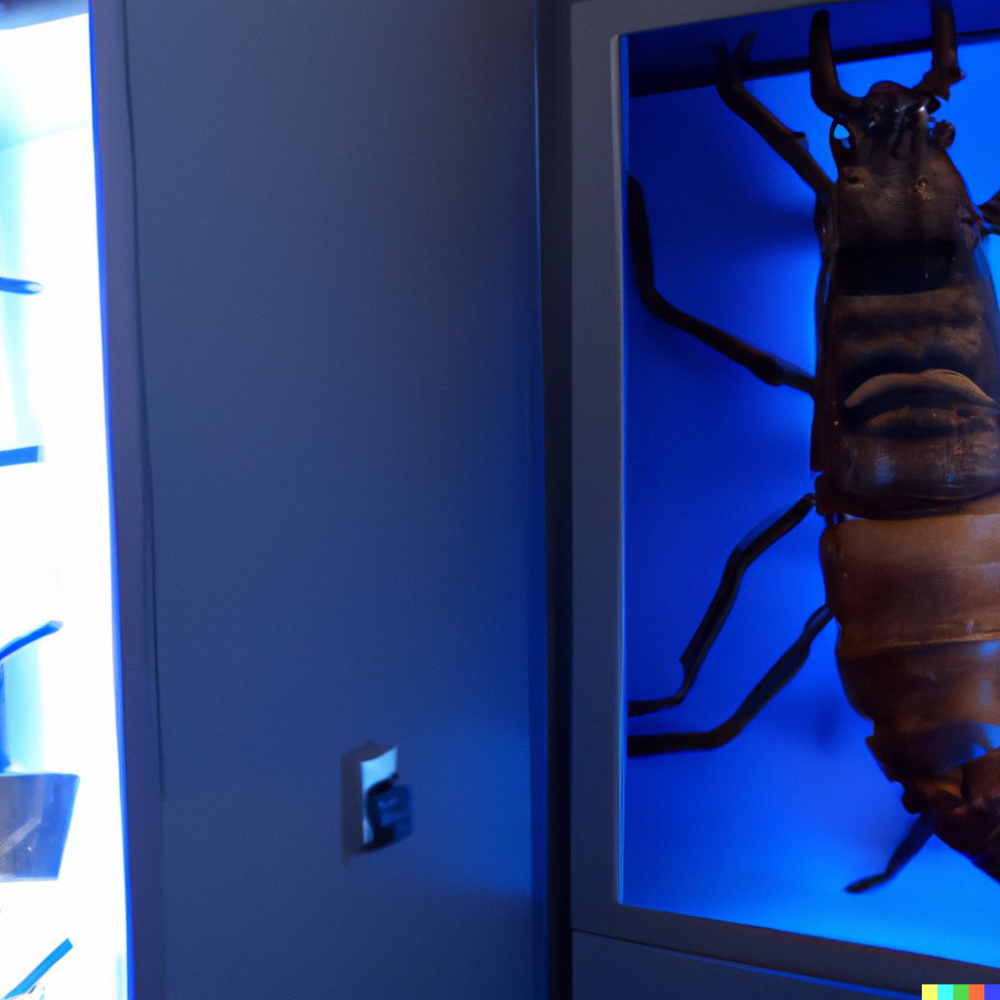

In [ ]:
sf[0]['image']

In [ ]:
knn_model.query(sf[0:1], k=10)

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 0            | 1       | 1.36986     | 7.546ms      |

| Done         |         | 100         | 50.957ms     |

+--------------+---------+-------------+--------------+

query_label,reference_label,distance,rank
0,0,0.0,1
0,8,19.009269375540264,2
0,30,19.5529999367219,3
0,6,19.730547636271925,4
0,55,20.058250451758436,5
0,4,20.060011724926625,6
0,51,20.09708159559191,7
0,37,20.162354684912625,8
0,45,20.739322706791178,9
0,22,21.346132726276604,10


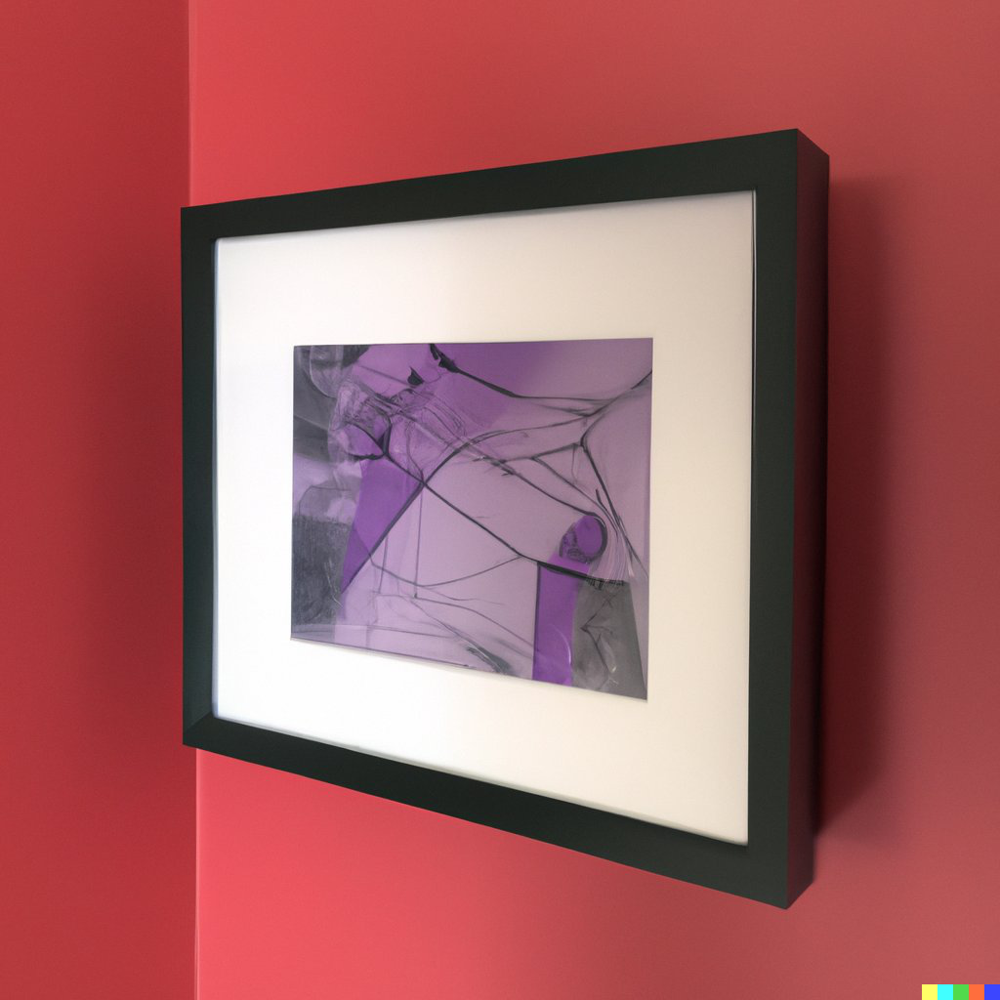

In [ ]:
sf[8]['image']

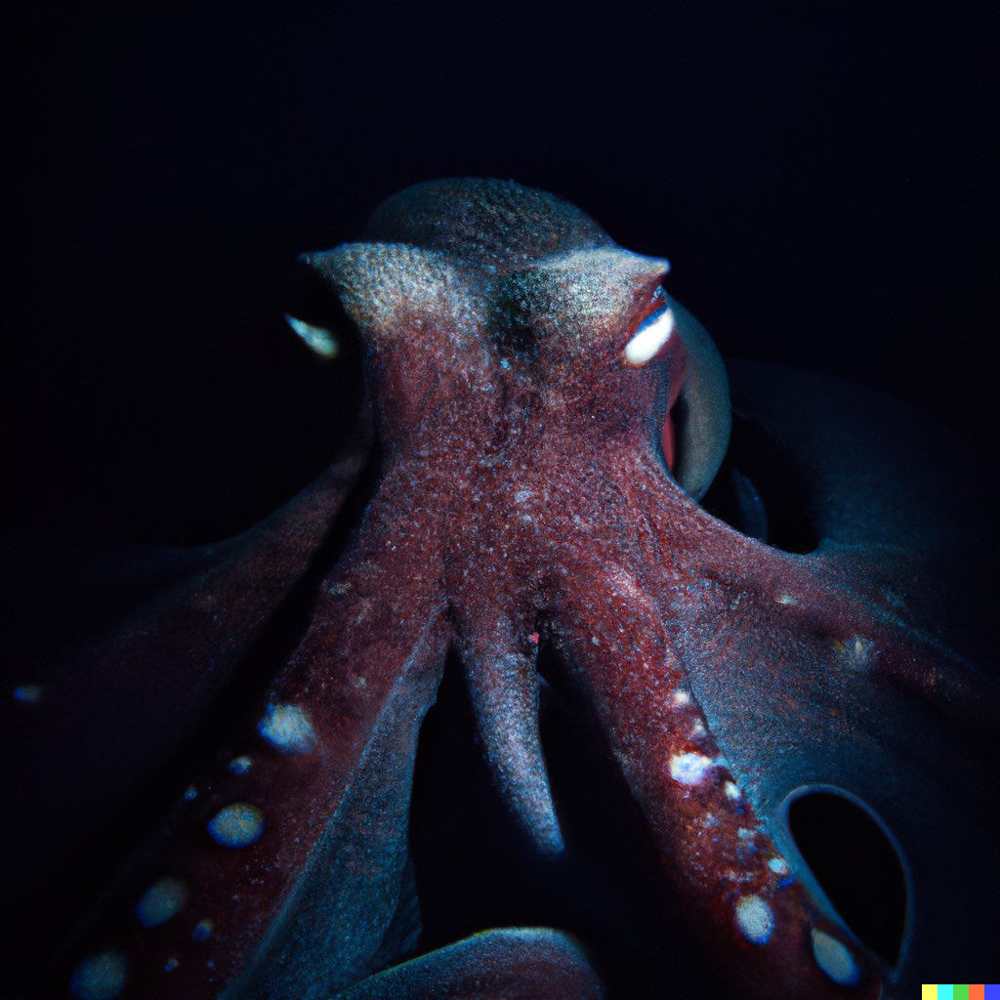

In [ ]:
sf[30]['image']

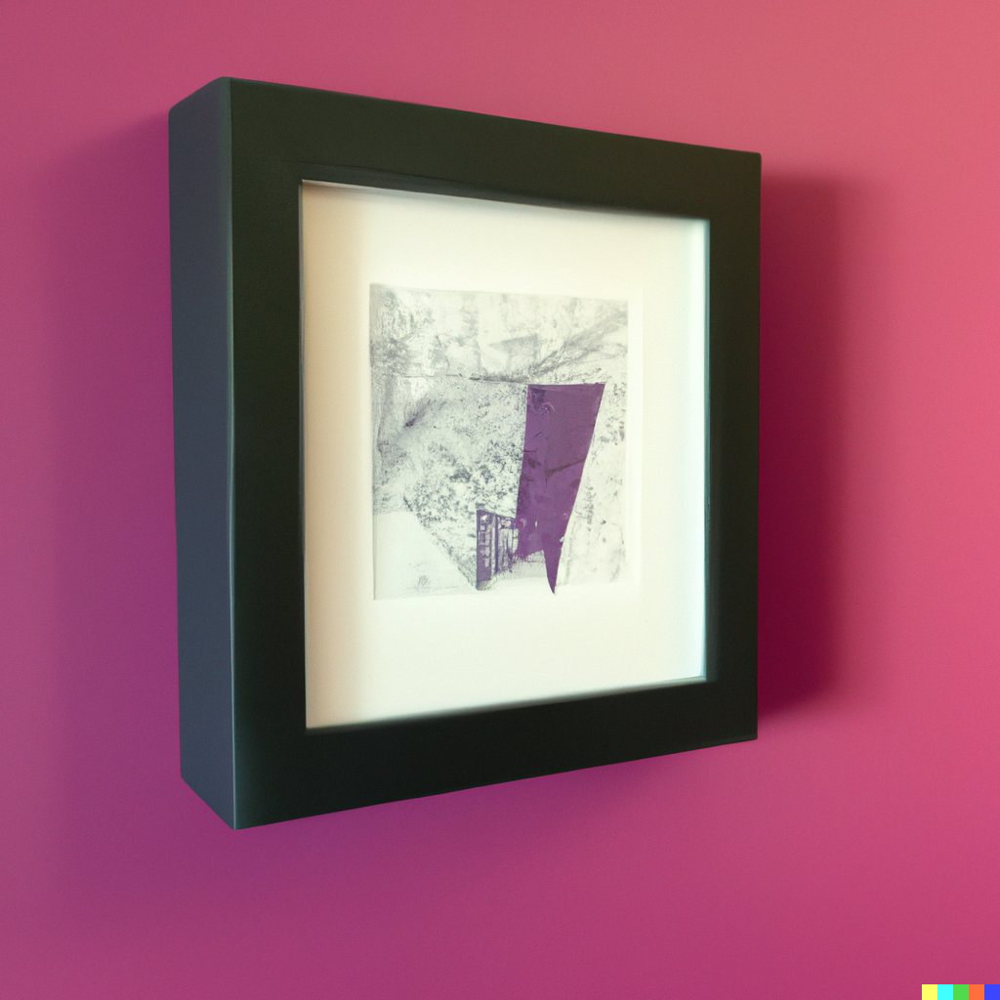

In [ ]:
sf[6]['image']

In [ ]:
model = tc.image_similarity.create(sf)
similarity_graph = model.similarity_graph(k=3)
similarity_graph.summary()

Starting brute force nearest neighbors model training.

Validating distance components.

Initializing model data.

Initializing distances.

Done.

Starting blockwise similarity graph construction.

max rows per data block: 6207

number of reference data blocks: 2

+---------+-------------+--------------+

| # Pairs | % Complete. | Elapsed Time |

+---------+-------------+--------------+

| 1332    | 32.4324     | 13.469ms     |

| 4107    | 100         | 28.975ms     |

+---------+-------------+--------------+

{'num_edges': 219, 'num_vertices': 73}

In [ ]:
import networkx as nx
g = nx.Graph()
for v in similarity_graph.vertices['__id']:
    g.add_node(v, attr_dict={'path':sf[v]['path']})
for e in similarity_graph.edges:
    g.add_edge(e["__src_id"], e["__dst_id"])
nx.info(g)

'Graph with 73 nodes and 168 edges'

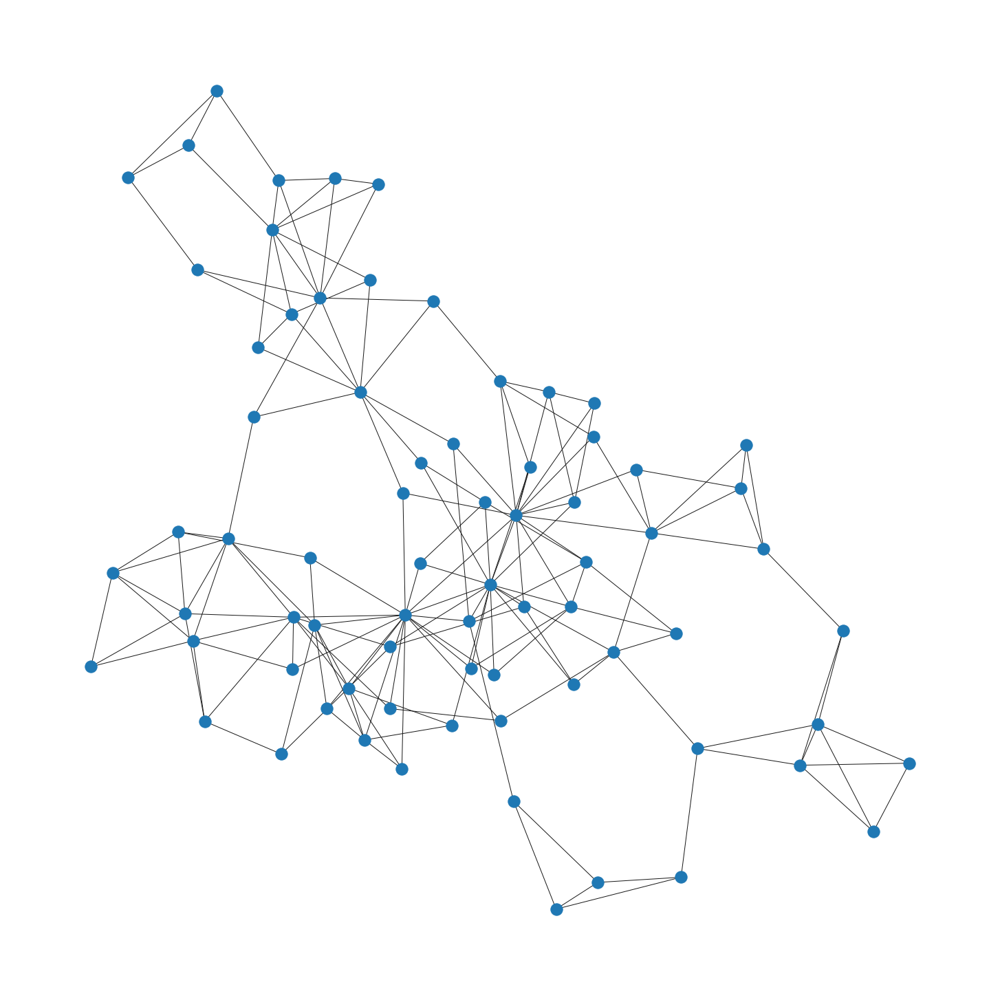

In [ ]:
plt.figure(figsize=(20,20))
nx.draw_kamada_kawai(g)

In [ ]:
X = sf['image_features']
print("Computed X: ", X.shape)
X_similarity = TSNE(n_components=2,perplexity=20, n_iter=5000, verbose=2).fit_transform(X)
print("Computed t-SNE", X_similarity.shape)

Computed X:  (73,)
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 73 samples in 0.001s...
[t-SNE] Computed neighbors for 73 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 73 / 73
[t-SNE] Mean sigma: 7.679103
[t-SNE] Computed conditional probabilities in 0.018s
[t-SNE] Iteration 50: error = 67.3464813, gradient norm = 0.4085602 (50 iterations in 0.145s)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Iteration 100: error = 65.8931580, gradient norm = 0.3778985 (50 iterations in 0.063s)
[t-SNE] Iteration 150: error = 62.4941597, gradient norm = 0.4641492 (50 iterations in 0.101s)
[t-SNE] Iteration 200: error = 64.9071960, gradient norm = 0.4585160 (50 iterations in 0.040s)
[t-SNE] Iteration 250: error = 66.2739410, gradient norm = 0.3921610 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.273941
[t-SNE] Iteration 300: error = 1.5551087, gradient norm = 0.0040585 (50 iterations in 0.067s)
[t-SNE] Iteration 350: error = 1.1208687, gradient norm = 0.0030633 (50 iterations in 0.048s)
[t-SNE] Iteration 400: error = 0.9114772, gradient norm = 0.0012658 (50 iterations in 0.043s)
[t-SNE] Iteration 450: error = 0.7323758, gradient norm = 0.0008207 (50 iterations in 0.146s)
[t-SNE] Iteration 500: error = 0.6169282, gradient norm = 0.0005668 (50 iterations in 0.136s)
[t-SNE] Iteration 550: error = 0.5892390, gradient norm = 0.0002983 (50 

In [ ]:
df = pd.DataFrame(columns=['x', 'y', 'path'])
df['x'], df['y'], df['path'] = X_similarity[:,0], X_similarity[:,1], sf['path']
df

,x,y,path
0,-20.123892,1.042979,/content/dalle_images/FW2MiCSWYAEceQH.jpg
1,-12.006436,-1.740033,/content/dalle_images/FW3-BsRWQAIaBZG.jpg
2,-17.628933,-3.149241,/content/dalle_images/FW4VQ6pXgAEx7Iq.jpg
3,-17.602518,-3.160202,/content/dalle_images/FW4VQ7EX0AImu-e.jpg
4,-10.765479,4.880816,/content/dalle_images/FW4lbBNWYAA2bfL.jpg
...,...,...,...
68,-9.238143,5.867979,/content/dalle_images/FWOPwi9WYAIuAAU.jpg
69,-11.625304,3.511810,/content/dalle_images/FWu1zOxaIAENhwT.jpg
70,-11.995296,1.470723,/content/dalle_images/FWw_L9NWAAE0tGw.jpg
71,-15.293378,-4.516610,/content/dalle_images/FWw_MGxXoAAy_Ac.jpg


In [ ]:
fig = px.scatter(df, x="x", y="y", hover_data=['path'], title='Image Similarity')
fig.show()

### Object Dedction

Using object dedction I wat to extract objects from each image.
It will be interesting to see which objects recur in most of the images.

In [ ]:
!pip install tensorflow==2.4.0

In [ ]:
from imageai.Detection import ObjectDetection

!wget -O ./yolo.h5 https://github.com/OlafenwaMoses/ImageAI/releases/download/1.0/yolo.h5


model_path = "./yolo.h5"
detector = ObjectDetection()
detector.setModelTypeAsYOLOv3()
detector.setModelPath(model_path)
detector.loadModel()

In [ ]:
def get_image_objects_list(object_detector, image_path, minimum_percentage_probability= 10):
    returned_image, detections = detector.detectObjectsFromImage(input_image=image_path,
                                             output_type="array",
                                             minimum_percentage_probability=minimum_percentage_probability
                                            )
    return [o['name'] for o in detections]

In [ ]:
l = []
for p in tqdm(sf['path']):
    l.append(get_image_objects_list(detector, p))
sf['objects'] = l
sf

  0%|          | 0/73 [00:00<?, ?it/s]

path,image,objects
/content/dalle_images/FW2MiCSWYAEceQH.jpg ...,Height: 1024 Width: 1024,[refrigerator]
/content/dalle_images/FW3-BsRWQAIaBZG.jpg ...,Height: 1200 Width: 981,"[umbrella, person]"
/content/dalle_images/FW4VQ6pXgAEx7Iq.jpg ...,Height: 1024 Width: 1024,[]
/content/dalle_images/FW4VQ7EX0AImu-e.jpg ...,Height: 1024 Width: 1024,[person]
/content/dalle_images/FW4lbBNWYAA2bfL.jpg ...,Height: 1200 Width: 1200,"[person, person]"
/content/dalle_images/FW600ZZXwAIX1jB.png ...,Height: 862 Width: 862,[tv]
/content/dalle_images/FW600ZbX0AE89ha.jpg ...,Height: 1024 Width: 1024,[]
/content/dalle_images/FW600ZcWIAEeNWV.jpg ...,Height: 1024 Width: 1024,[]
/content/dalle_images/FW600ZfWQAItc61.jpg ...,Height: 1024 Width: 1024,[tv]
/content/dalle_images/FW600qFXkAMVcO9.jpg ...,Height: 1024 Width: 1024,[person]


In [ ]:
images_words = [y for x in sf['objects'] for y in x]
images_words_dict = dict(Counter(images_words))
df_words = pd.DataFrame(images_words_dict.items(), columns=['word', 'count']).sort_values(by=['count'],ascending=False)
df_words

,word,count
2,person,65
35,toilet,7
32,motorcycle,6
10,dog,5
22,traffic light,4
17,frisbee,3
4,baseball bat,3
6,backpack,3
26,bowl,3
23,scissors,3


<AxesSubplot:xlabel='count', ylabel='word'>

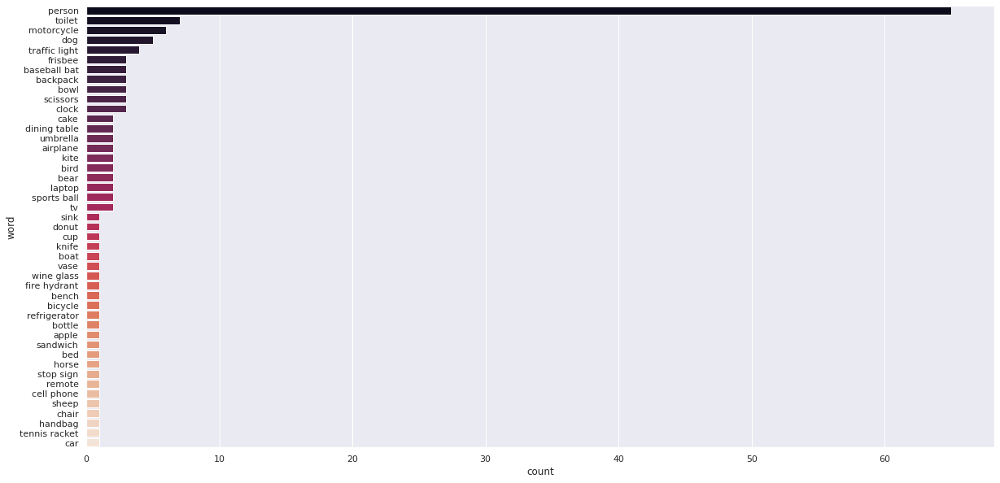

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(y='word', x="count", palette="rocket", data=df_words)

### Topic Models

Using the objects that I found in each image, I will run LDA to find 10 topics.
In this way I will be able to understand what topics the images are divided into.


In [ ]:
# Converting the data to work in Gensim
id2word = corpora.Dictionary(sf['objects'])
corpus = [id2word.doc2bow(text) for text in sf['objects']]

In [ ]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10,
                                           update_every=0,
                                           chunksize=500,
                                           alpha='auto',
                                           per_word_topics=True)

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.232077 -0.018504       1        1  41.588497
9     -0.239053  0.049544       2        1  22.689444
1      0.156502  0.210774       3        1   7.973669
8     -0.122228  0.031099       4        1   5.852118
5      0.076607 -0.122722       5        1   5.851834
7      0.065767 -0.057323       6        1   4.347907
2      0.091977 -0.081708       7        1   3.728661
4      0.076757 -0.029141       8        1   2.790435
6      0.067682  0.025296       9        1   2.759165
0      0.058065 -0.007314      10        1   2.418272, topic_info=          Term       Freq      Total Category  logprob  loglift
1       person  52.000000  52.000000  Default  30.0000  30.0000
37      toilet   5.000000   5.000000  Default  29.0000  29.0000
32  motorcycle   5.000000   5.000000  Default  28.0000  28.0000
10         dog   4.000000   4.000000  Default  27.0000  27.0000
23    scissors   2.000000   2.000000  Default  26.0000  26.0000
..         ...        ...        ...      ...      ...      ...
4     backpack   0.065511   3.120352  Topic10  -4.0074  -0.1414
18     frisbee   0.065509   3.232071  Topic10  -4.0074  -0.1766
27        bowl   0.065508   3.053579  Topic10  -4.0074  -0.1198
19        kite   0.065506   2.307965  Topic10  -4.0074   0.1601
11        bear   0.065505   2.395359  Topic10  -4.0075   0.1230

[440 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
21        1  0.446323    airplane
21        6  0.446323    airplane
26        2  0.680984       apple
4         1  0.640953    backpack
4         2  0.320477    backpack
...     ...       ...         ...
3         9  0.455095          tv
2         2  0.461084    umbrella
2         4  0.461084    umbrella
38        3  0.689635        vase
42        1  0.641585  wine glass

[64 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 10, 2, 9, 6, 8, 3, 5, 7, 1])